# Introduction To Rusty Axe

This notebook will give you a guided tour through using Rusty Axe.

We'll use the iris toy dataset for simplicity and speed, but if you have a dataset you wish to analyize, you should feel free to copy this notebook and swap out the iris matrix for a matrix or an input/output pair of your choice!

Brief note about system requirements: the advantage of Random Forest Regressors is that they can run fairly efficiently by down-sampling large datasets during bootstrapping. You will need enough memory to fully load your dataset, but once it is loaded, the memory requirement per extra thread will depend on your bootstrapping settings. If you are running this on a laptop or personal machine, feel free to do a test run with the setting p=1. This will restrict the RF to a single thread and allow you to monitor memory usage. 

## Loading The Data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
# import scanpy as sc

import pickle 

data_location = "./iris/"

iris = np.loadtxt(data_location + "iris.tsv")
iris_features = np.loadtxt(data_location + "iris.features",dtype=str)

Firstly we will need to train a random forest regressor describing our data. We recommend starting with the built-in RFR because it has better support for unsupervised forests, but support for sk-learn based forests is also available. 

We need to describe several important settings here.

In [2]:
from rusty_axe import lumberjack,tree_reader

forest = lumberjack.fit(
    iris, 
    # Input: n by m numpy array. Rows should be samples, columns should be features (eg genes or measurements)
    # If only one array is provided, Rusty Axe defaults to unsupervised mode, where features with the same name 
    # cannot be in both the input and the output.

    header=iris_features,
    # Header of feature names. This will be enormously helpful for interpretation, so we recommend providing it here.

    trees=500,
    # Numer of trees to train. For multi-output forests such as scRNAseq data, the number of unique trees is 
    # generally less important than the depth, so try it with 100 first. 
    # See saturation analysis tutorial for more information. 
    
    input_feature_subsample=2,
    # Input feature subsampling rate, eg how many features can potentially be split on at each bootstrap. 
    # Rule of thumb: use 1/2 to 1/3 of all features. (eg if you are observing 2000 variable genes, say 700 here)
    
    output_feature_subsample=2,
    # Output feature subsampling rate, eg how many features are evaluated for improvement in dispersion at each 
    # bootstrap. Apply similar rule of thumb as to inputs. 
    
    ss=50,
    # Sample subsampling rate. Number of samples evaluated at each bootstrap. This parameter depends on how 
    # "grainy" your data is. If you are looking for small, rare clusters first, the rule of thumb should be
    # to use higher values (500-1000).
    # Conversely, if you are looking big, obvious clusters first, leave this value small (150-300)
    
    
    depth=3,
    # Maximum depth of each tree. 
    # This value determines the complexity of the factors you will obtain. 
    # If your data isn't very complicated leave this value low (~5-6)
    # If your data has a lot of complexity and heterogeneity, set this value higher (8-10)

    
    sfr=0,
    norm='l1',
    dispersion_mode = "ssme",
    standardize = "true",
    # These are helpful defaults for the optimization metric to use. For more details please refer to the 
    # optimization metric tutorial. 
    

    reduce_input='false',
    reduce_output='false',
    # These parameters dictate whether or not dimensional reduction is applied at each node split. 
    # For sparse data such as scRNAseq this can be enormously helpful in making more highly interpretable trees
    # On the other hand if your data is poorly behaved under dimensional reduction, this setting can be left off. 
    
    cache = True
    # This setting is true by default, but please keep it in mind if you need to train a very large
    # forest, or one with a huge number of features. 
    # This setting prevents Python from caching a variety of values within individual nodes, potentially saving
    # much space in memory, but it slows down all computations considerably. 

    # Set this to false when you wish to train a very large forest and then immediately filter it to a smaller
    # forest based on some criterion. 
)

Setting context
Input:(150, 4)
Output:(150, 4)
Generating trees
Running /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/bin/rf_5
Command: /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/bin/rf_5 -ic /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/input.counts -oc /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/output.counts -o /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp -auto -ifh /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.ifh -ofh /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.ofh -trees 500 -input_feature_subsample 2 -output_feature_subsample 2 -ss 50 -depth 3 -sfr 0 -norm l1 -dispersion_mode ssme -standardize true -reduce_input false -reduce_output false
Read parameters

5.1 0
100
150,4

5.1 0
100
150,4
Reading header: /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.ifh
Read 4 lines
Reading header: /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/

Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.tree_307.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.tree_308.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.tree_309.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.tree_31.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.tree_310.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.tree_311.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.tree_312.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.tree_313.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.tree_314.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.tree_315.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpbl0zwrjx/tmp.tree_316.compact
Loading /va

In [14]:
forest.backup("./iris_forest")
'''Forests aren't determsinistic in nature, so if you wish to continue an analysis that you started, don't depend on repeating the same calculations and getting an exactly identical answer. For convenience we instead provide this method of saving a forest so that you can reload it later. Most computations should be cached in the saved forest '''

Saving forest
./iris_forest


"Forests aren't deterministic in nature, so if you wish to continue an analysis that you started, don't depend on repeating the same calculations and getting an exactly identical answer. For convenience we instead provide this method of saving a forest so that you can reload it later. Most computations should be cached in the saved forest "

## Analyzing Nodes 

/Users/bbrener1/miniconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


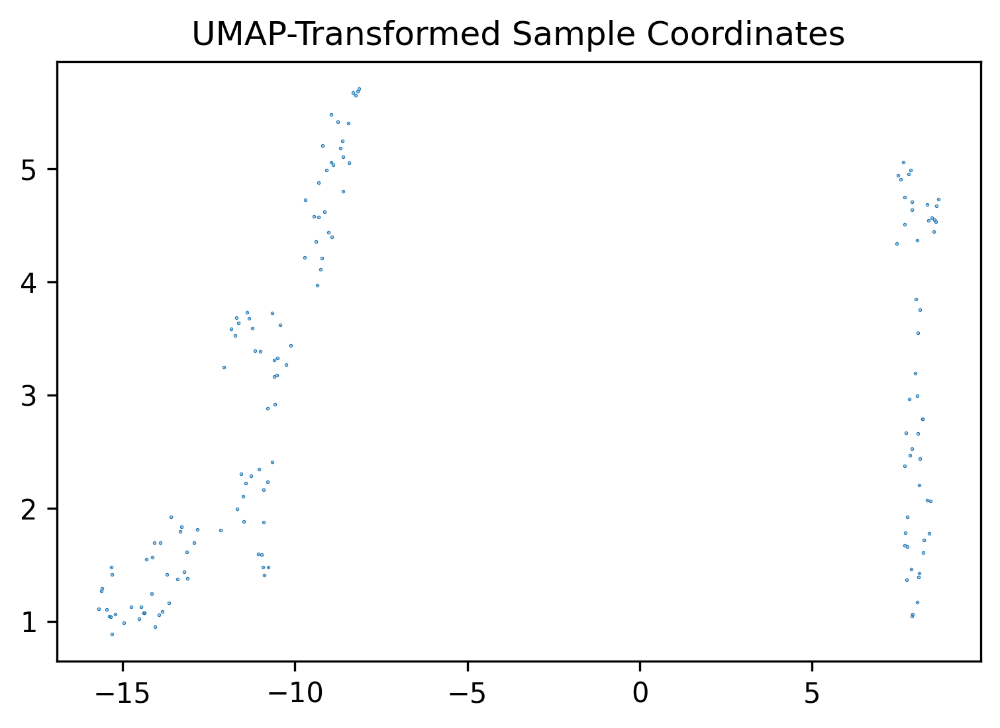

/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


array([[ 1.3678594 , -0.32912546],
       [ 1.4554905 ,  1.2008284 ],
       [ 1.3736688 ,  1.1400505 ],
       [ 1.3736848 ,  1.1855001 ],
       [ 1.3507868 , -0.38988802],
       [ 1.3709992 , -1.0063246 ],
       [ 1.3505511 ,  1.0505369 ],
       [ 1.3655485 ,  0.00967037],
       [ 1.3622569 ,  1.3505994 ],
       [ 1.4455911 ,  1.0660053 ],
       [ 1.408751  , -0.90918833],
       [ 1.3849322 ,  0.6049338 ],
       [ 1.4349993 ,  1.0916933 ],
       [ 1.3471534 ,  1.4223995 ],
       [ 1.3889825 , -1.205811  ],
       [ 1.3732954 , -1.2880583 ],
       [ 1.3951412 , -1.0327338 ],
       [ 1.37249   , -0.28765273],
       [ 1.3926314 , -1.0553465 ],
       [ 1.3525406 , -0.7899415 ],
       [ 1.4197435 , -0.5988881 ],
       [ 1.3584632 , -0.69513756],
       [ 1.3261169 ,  0.9354807 ],
       [ 1.4066741 , -0.11064252],
       [ 1.3982484 ,  0.54354286],
       [ 1.4481565 ,  1.1618314 ],
       [ 1.3898661 ,  0.02871661],
       [ 1.3961558 , -0.5053939 ],
       [ 1.3968062 ,

In [4]:
# Firstly we can visualize an embedding of our data using TSNE or UMAP to get a feel for the distribution of 
# the underlying values

forest.coordinates(type='umap')

In [5]:
# Now let's cluster the nodes of our RFR and see if any patterns emerge. 

forest.interpret_splits(
    mode='partial',
    resolution=1,
    k=200,
    pca=4
)

Node 6000

Node 6000

Complete:6711

Searching for partition
Louvain: (6712,)


array([10,  7, 10, ...,  4,  3,  0])

In [6]:
forest.maximum_spanning_tree(
    mode='samples'
)

Max tree debug
[[0.99998641 0.96658401 0.94354769 0.99896395 0.99922508 0.8674973
  0.87007327 0.93647966 0.72455682 0.88470364 0.92415309 0.72273818
  0.8766794 ]
 [0.78534692 0.84457781 0.84974915 0.79160538 0.7906867  0.57016646
  0.57422933 0.61581733 0.70450263 0.59891854 0.60436974 0.71082174
  0.59218301]
 [0.8740136  0.88962911 0.88457061 0.8811306  0.87979234 0.64403224
  0.64723392 0.7745086  0.79926392 0.66279103 0.75295337 0.79469976
  0.65006969]
 [0.80155442 0.63635722 0.57199918 0.77847485 0.78253231 0.98575407
  0.98428607 0.9237635  0.17605102 0.985391   0.93023572 0.17264287
  0.98708937]
 [0.69571818 0.83794337 0.8771801  0.72262054 0.71811829 0.25037068
  0.25641924 0.44643239 0.99478363 0.27970991 0.41858871 0.99558961
  0.26426394]
 [0.84081444 0.70312428 0.64954204 0.8266645  0.82964155 0.9235955
  0.92610866 0.93464259 0.32696423 0.93447616 0.94166429 0.32245781
  0.93449044]
 [0.66618519 0.55587923 0.5109407  0.64331717 0.64631052 0.83439025
  0.83033177 0.6821

[0,
 [[1, []],
  [2, []],
  [3, [[5, []], [6, []], [9, [[7, []], [10, []]]], [12, []]]],
  [4, [[8, []], [11, []]]]]]

Now we would like to visualize the approximate consensus tree structure in our random forest. 

The next function should provide you with an HTML report of the forest. (Please be patient, it takes a little while to render the complete report) 

Summarizing:0
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[101.96440452  27.95668663 462.93785762  86.60652029],A:[nan nan nan nan]
Error ratio: [nan nan nan nan]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


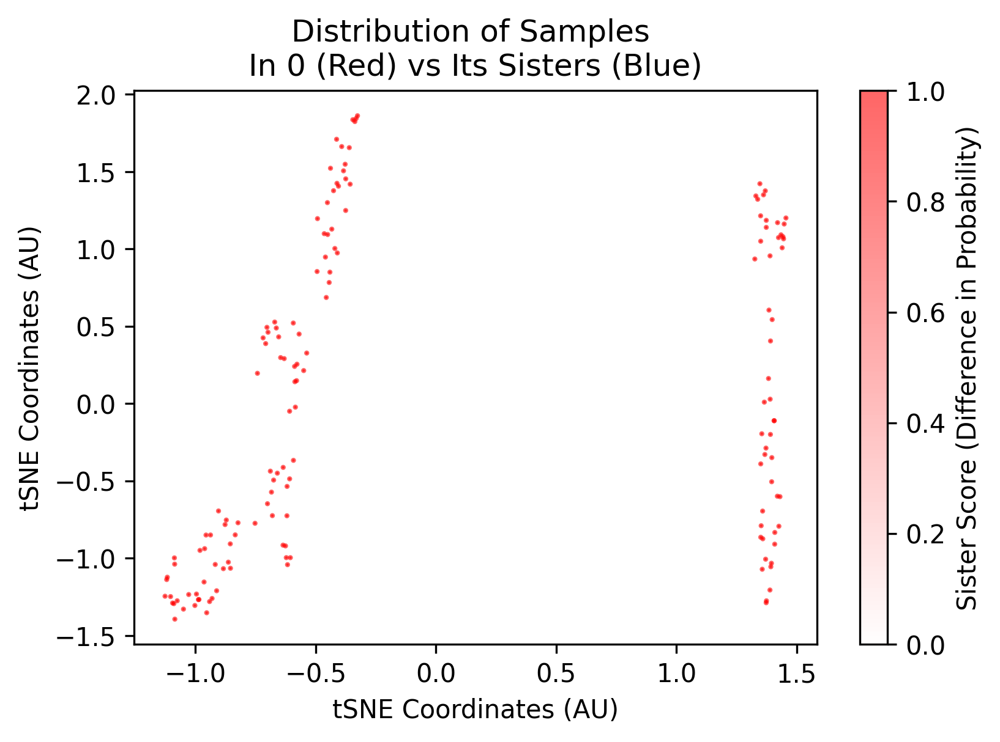

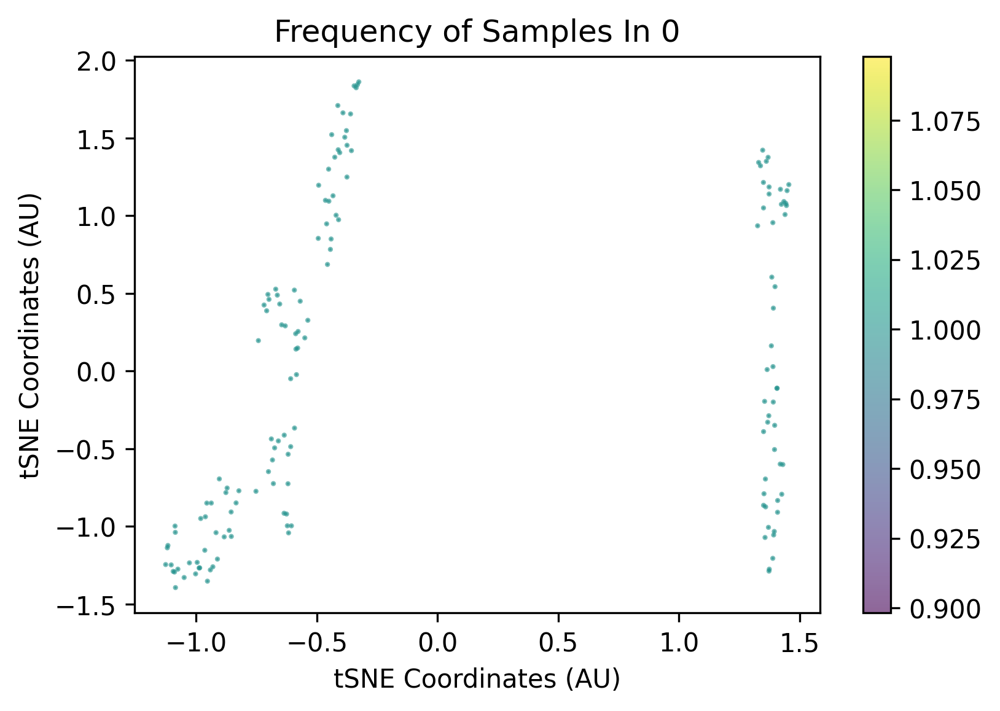

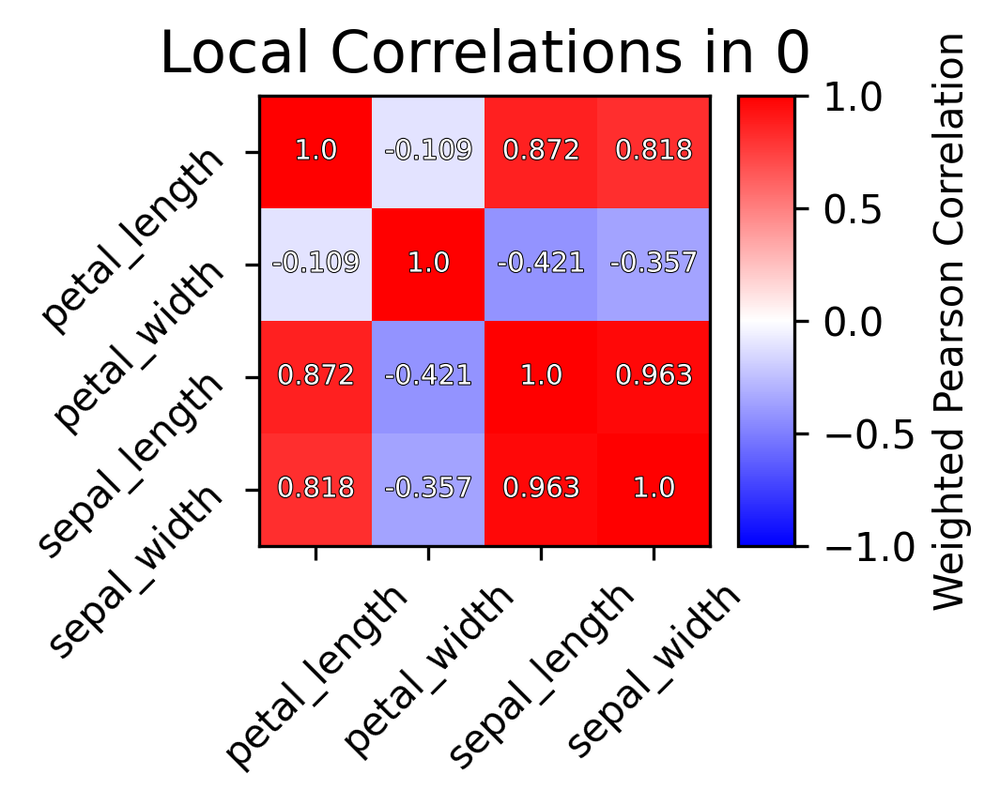

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


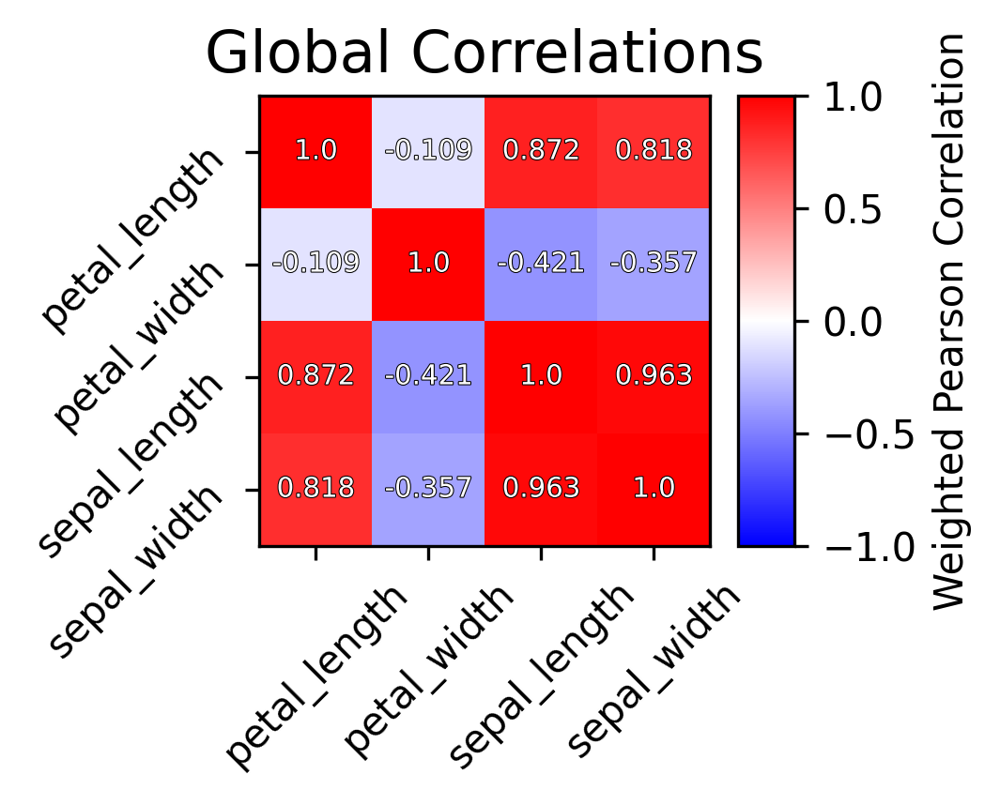

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/0/
Summarizing:1
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[16.33248145  4.53906388 93.56756061 17.55423938],A:[18.09953817  4.87179269 92.225792   17.49245029]
Error ratio: [0.9074817  0.94333437 1.01439268 1.00334131]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


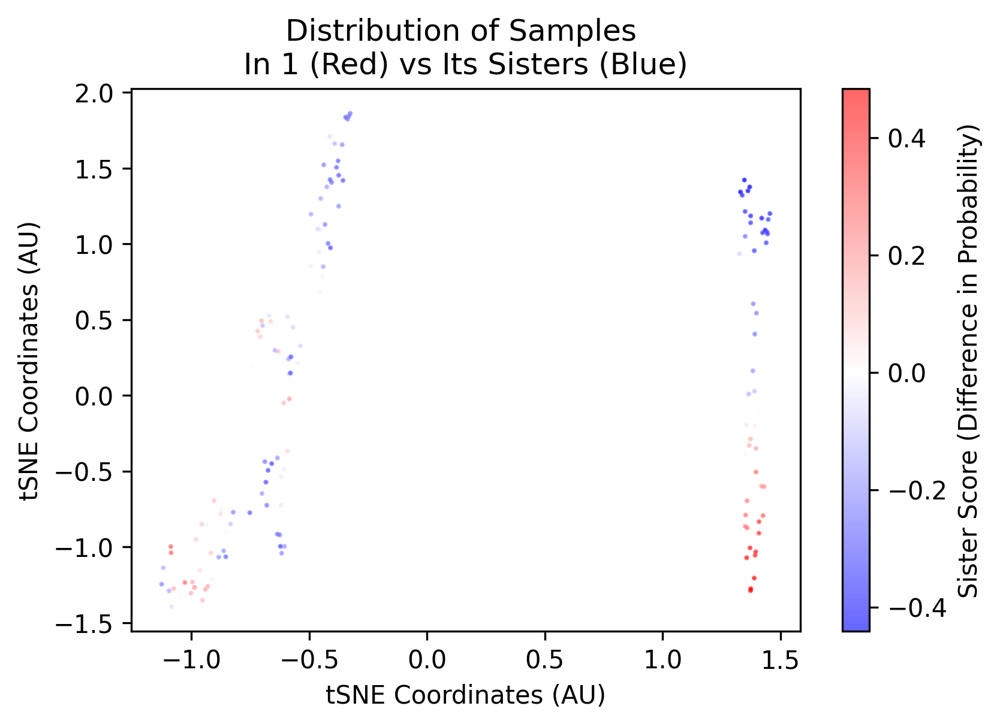

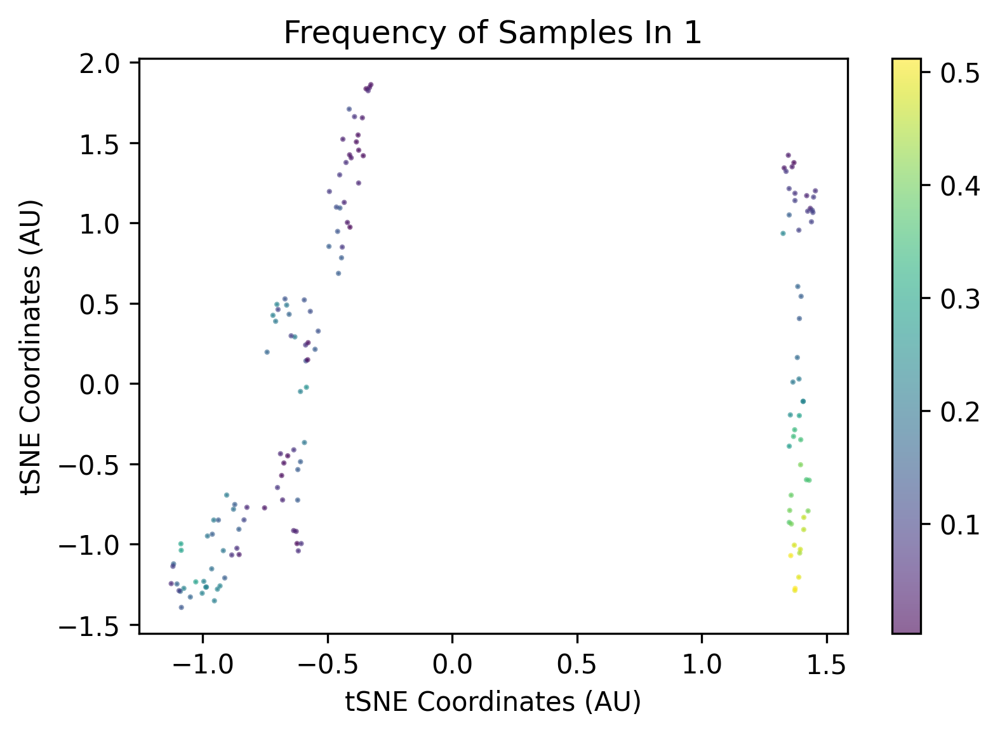

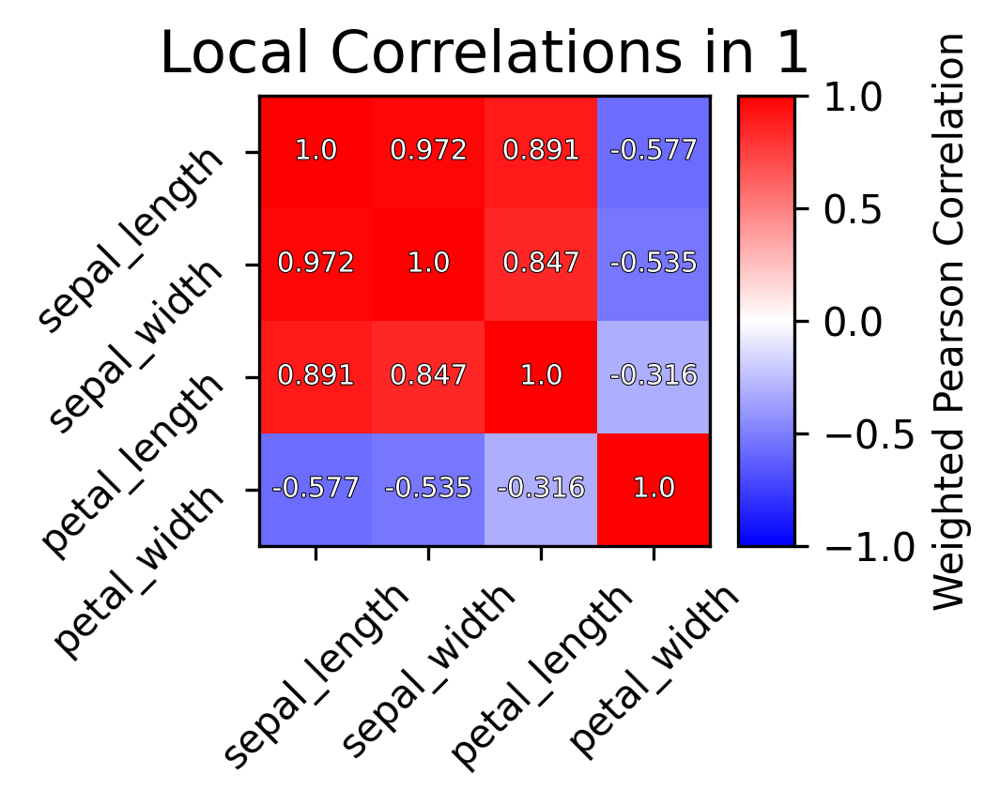

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


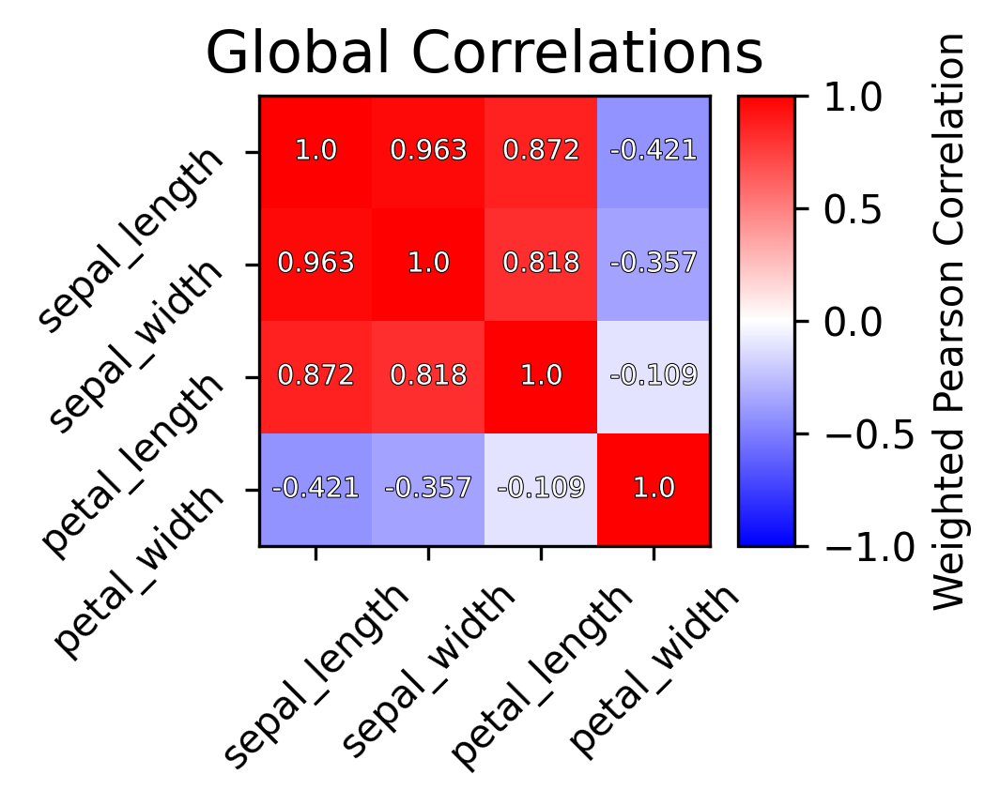

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/1/
Summarizing:2
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[ 23.52371585   4.71815575 108.50546068  19.38225614],A:[ 22.32107236   6.74136879 109.48333764  19.34465614]
Error ratio: [1.05156896 0.73864919 0.9911491  1.00184815]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


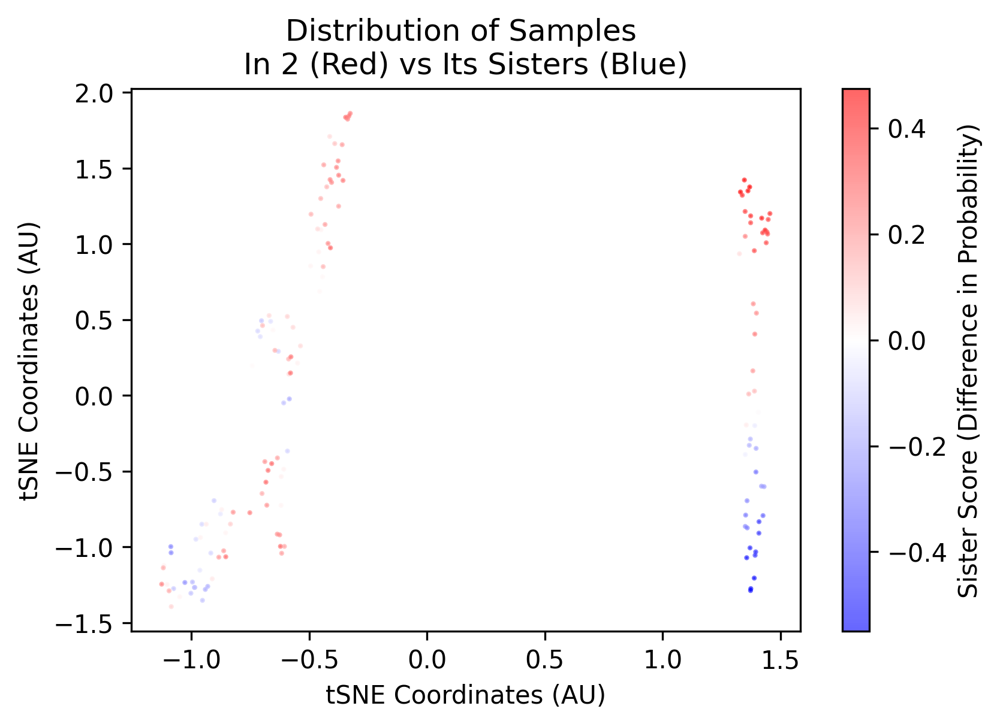

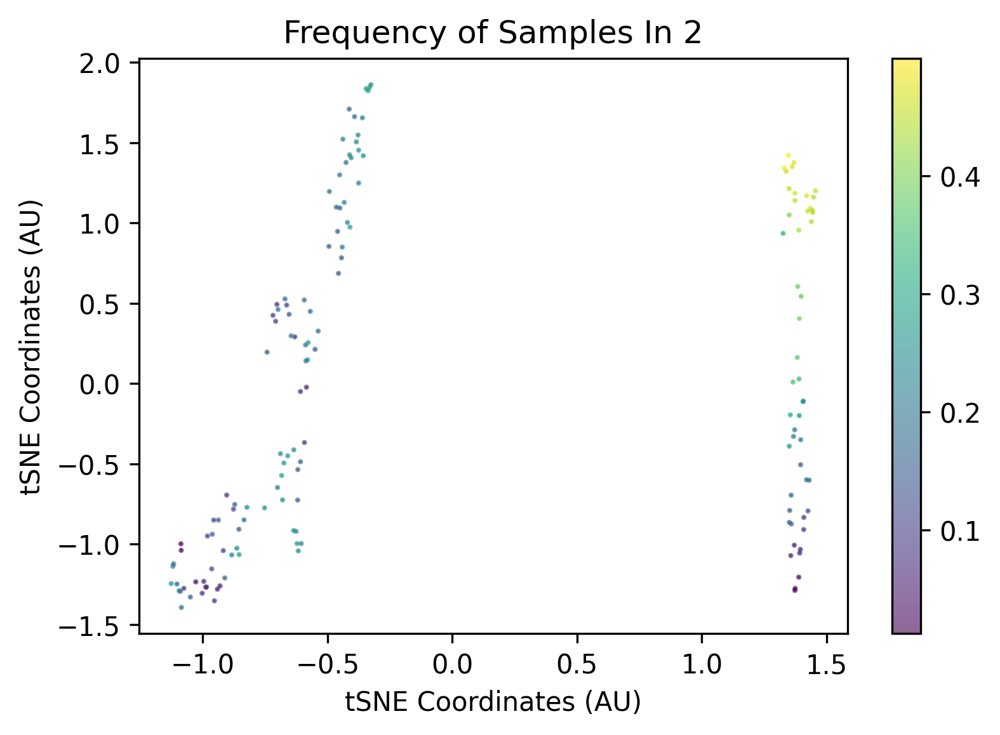

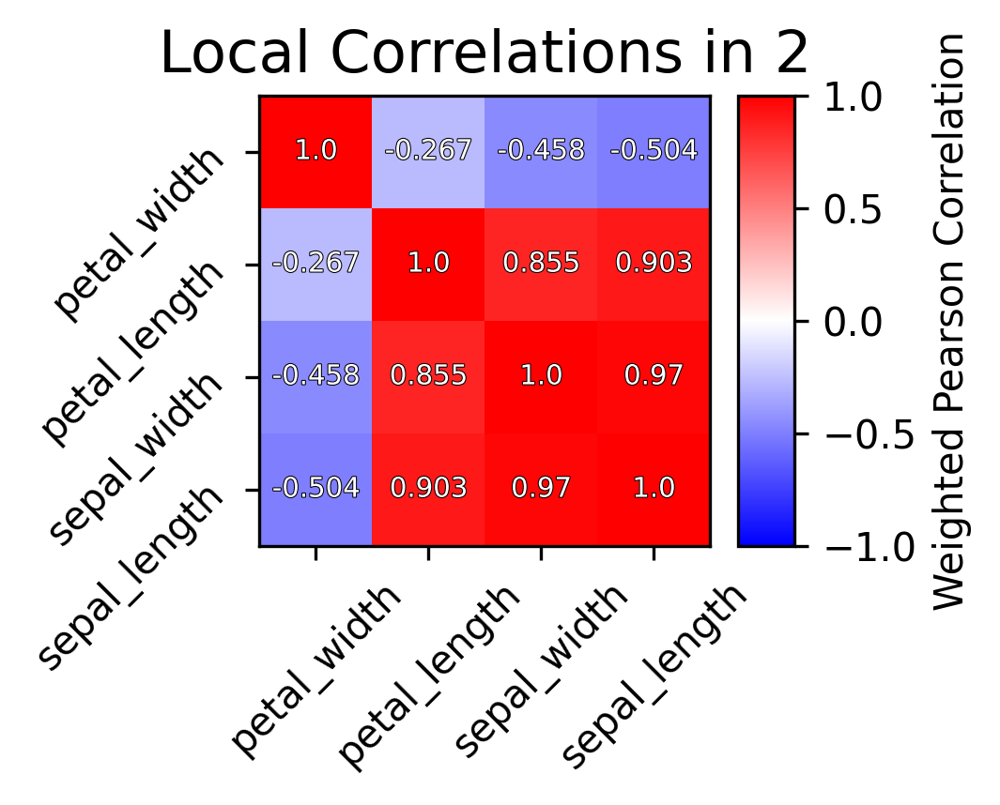

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


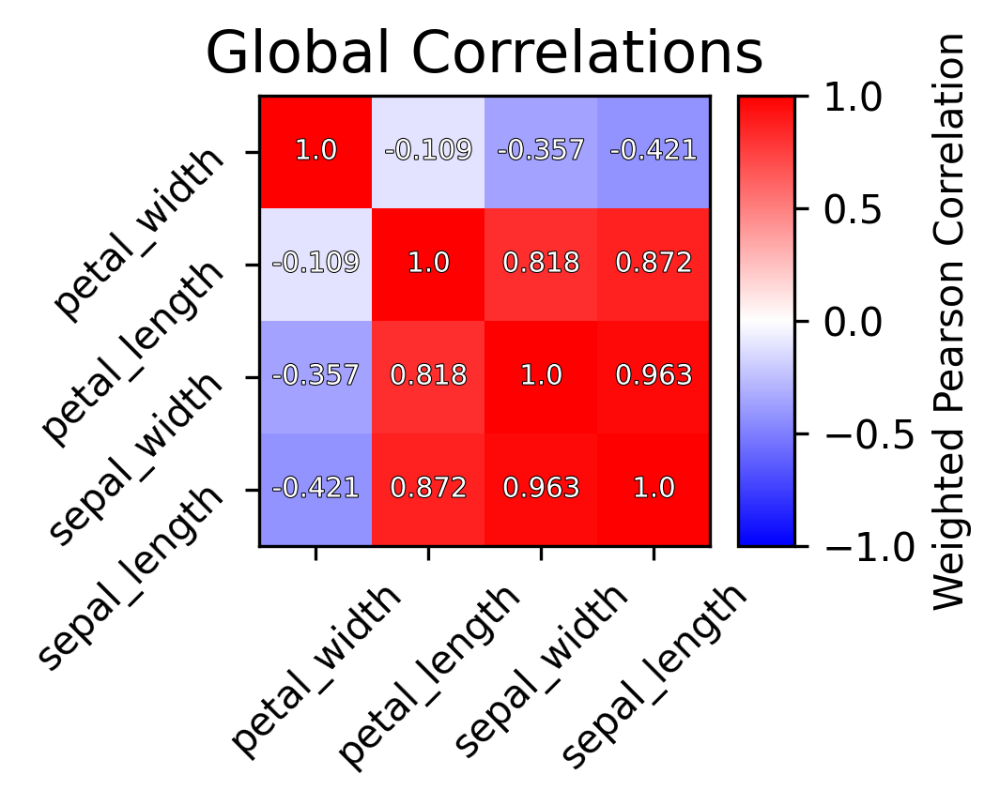

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/2/
Summarizing:3
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[29.68248561  8.13387917 54.86037688 13.84538642],A:[ 52.64818259  10.28484842 200.20158158  39.51244733]
Error ratio: [0.57192032 0.80939316 0.27763389 0.36644013]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


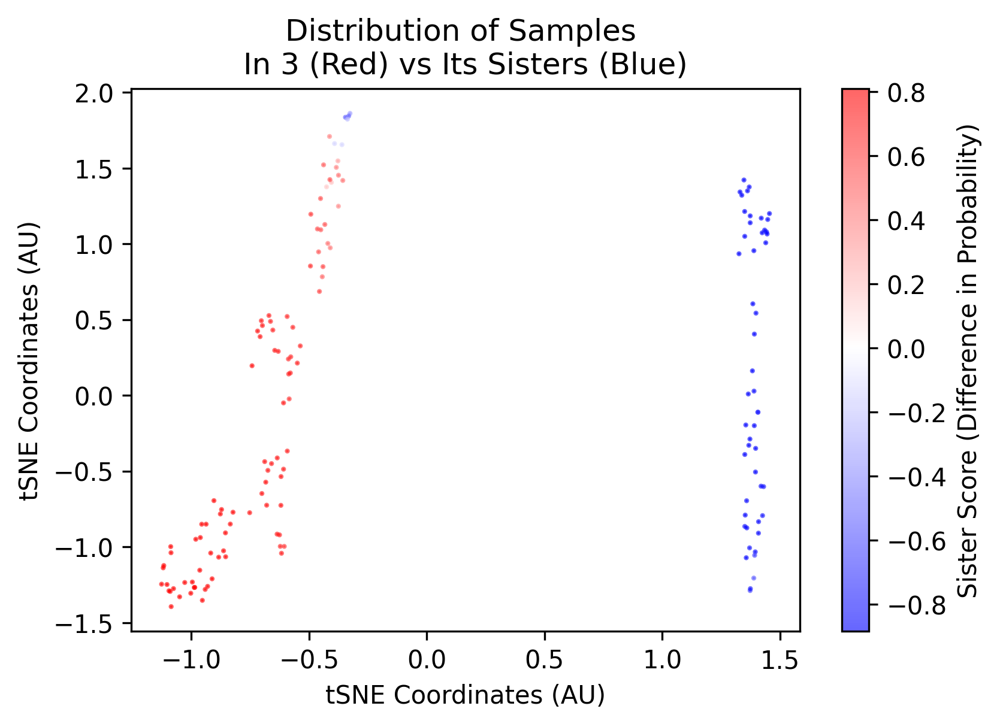

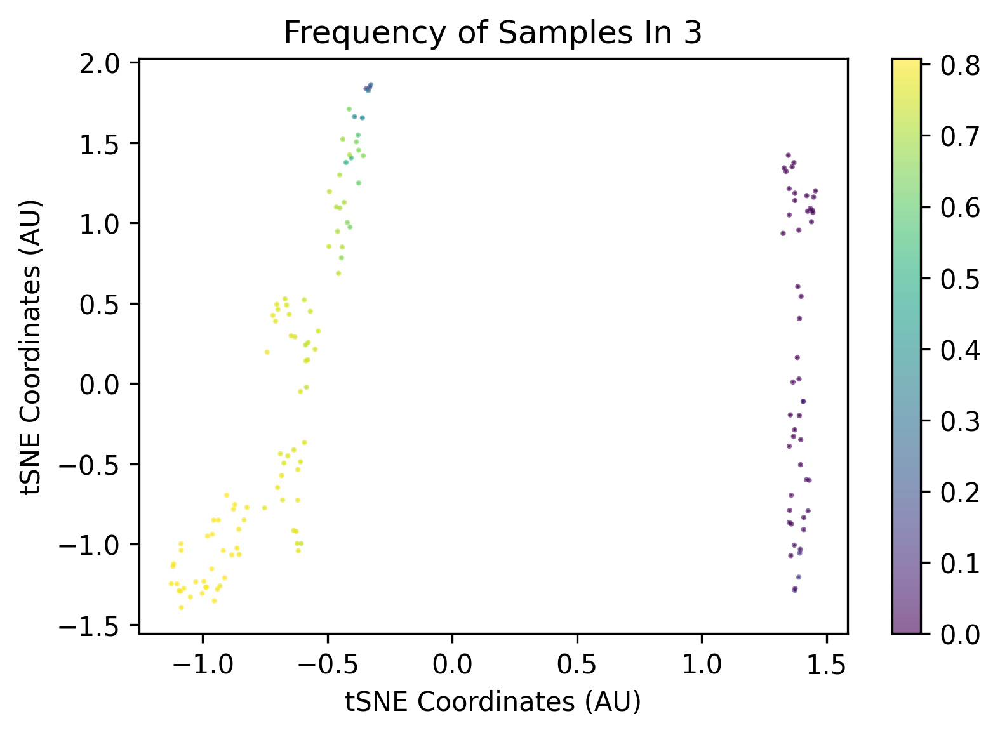

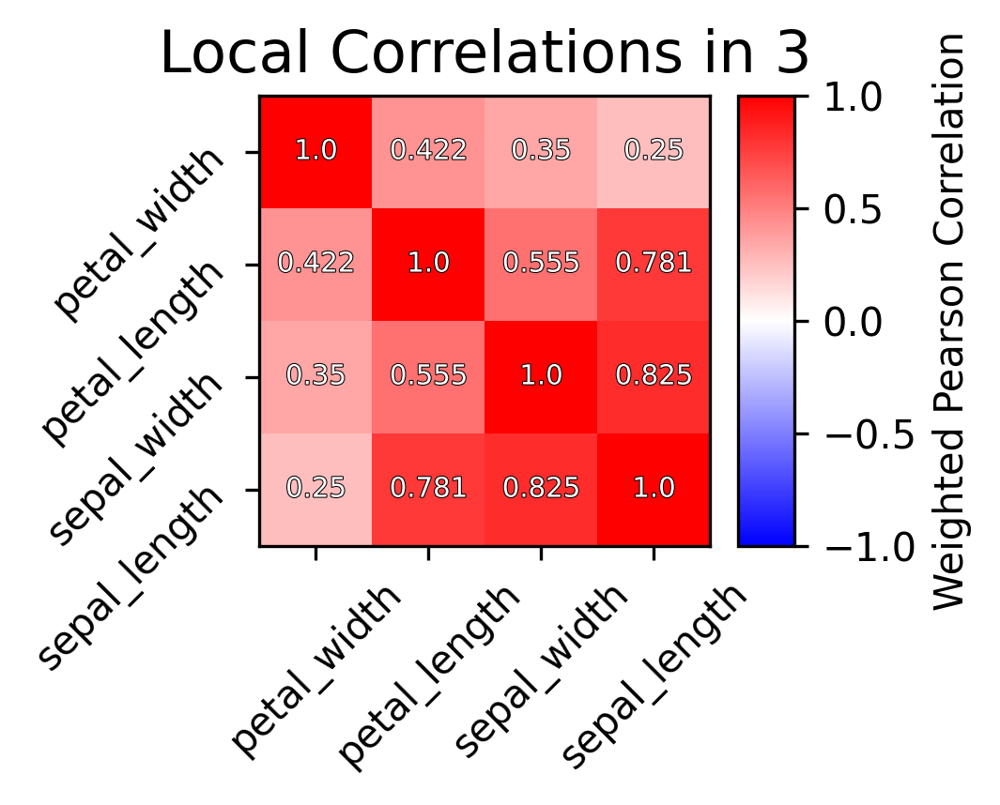

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


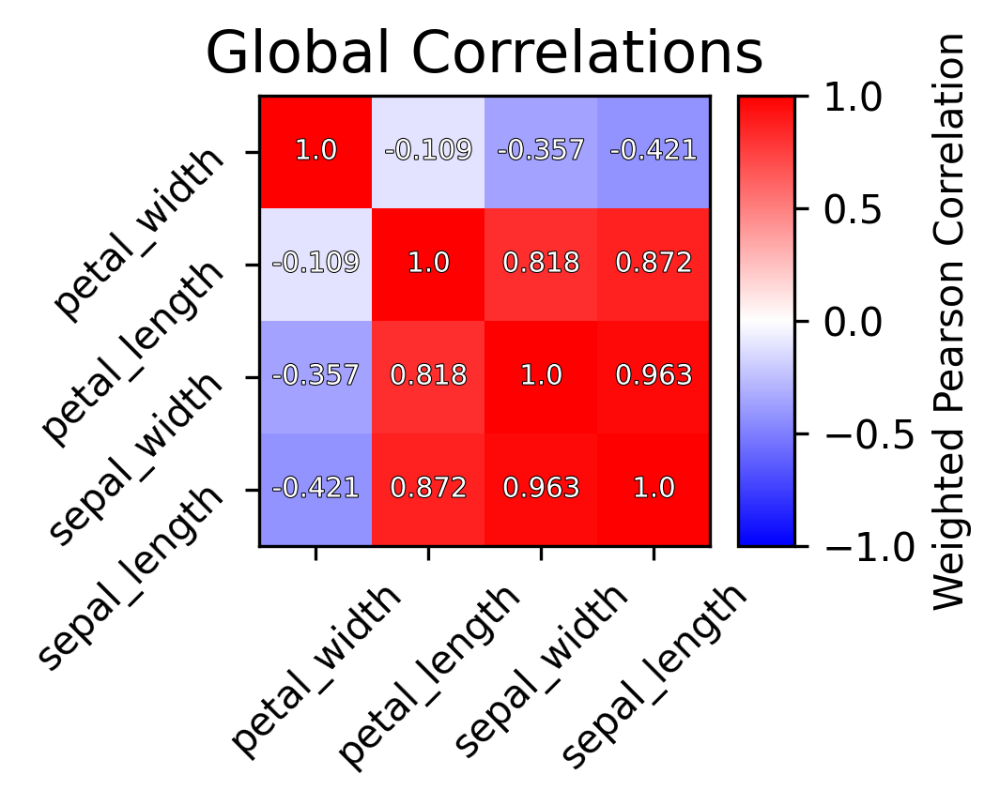

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/3/
Summarizing:4
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[10.13789738 12.43337653 56.44024015  9.48775607],A:[ 33.75753607  14.03004896 199.715234    35.04965516]
Error ratio: [0.32044554 0.89376798 0.28617778 0.29092528]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


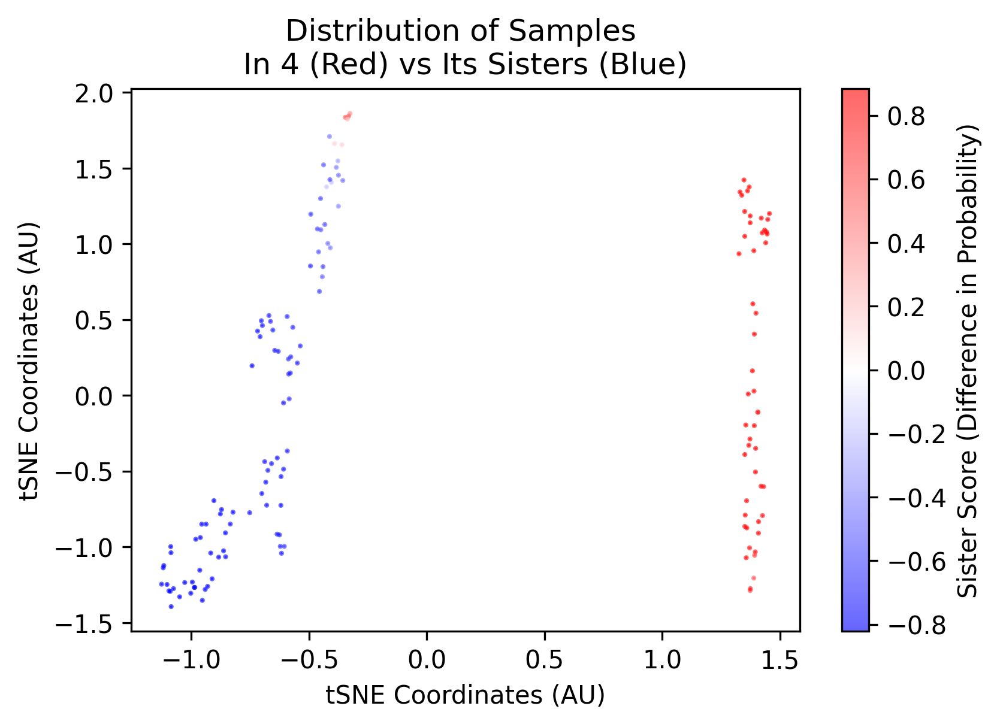

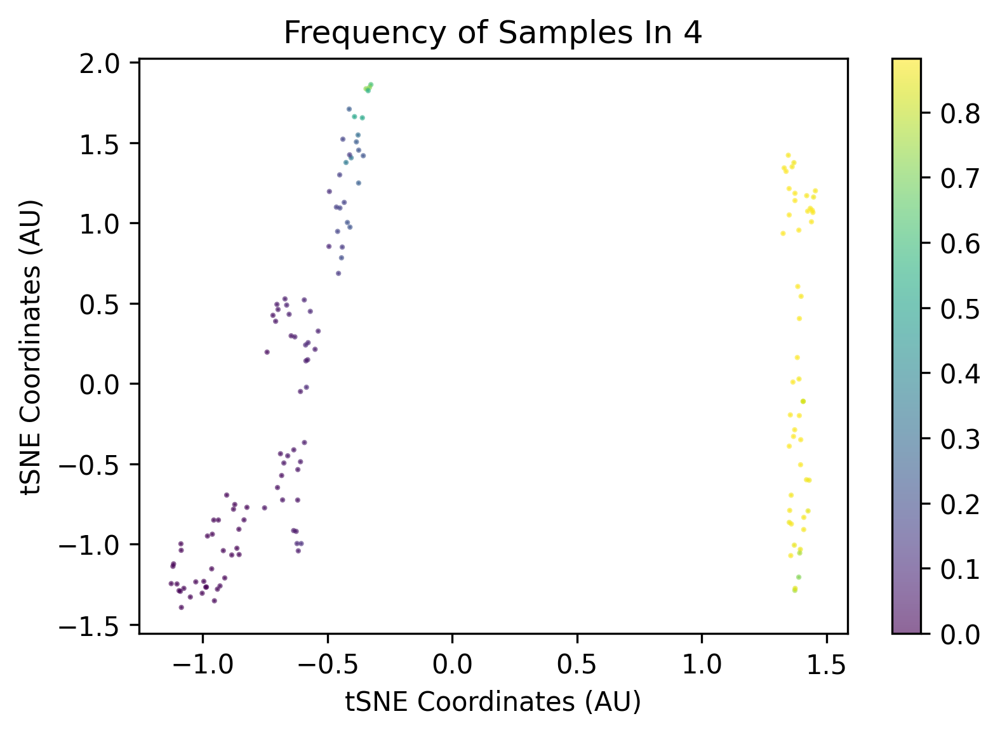

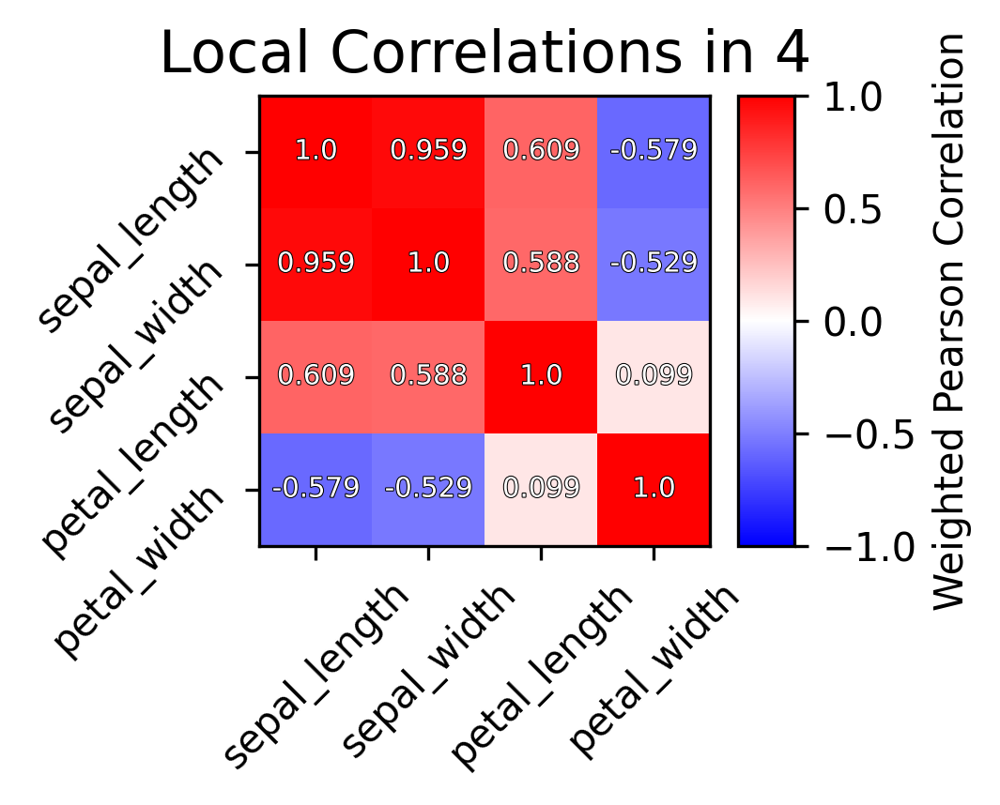

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


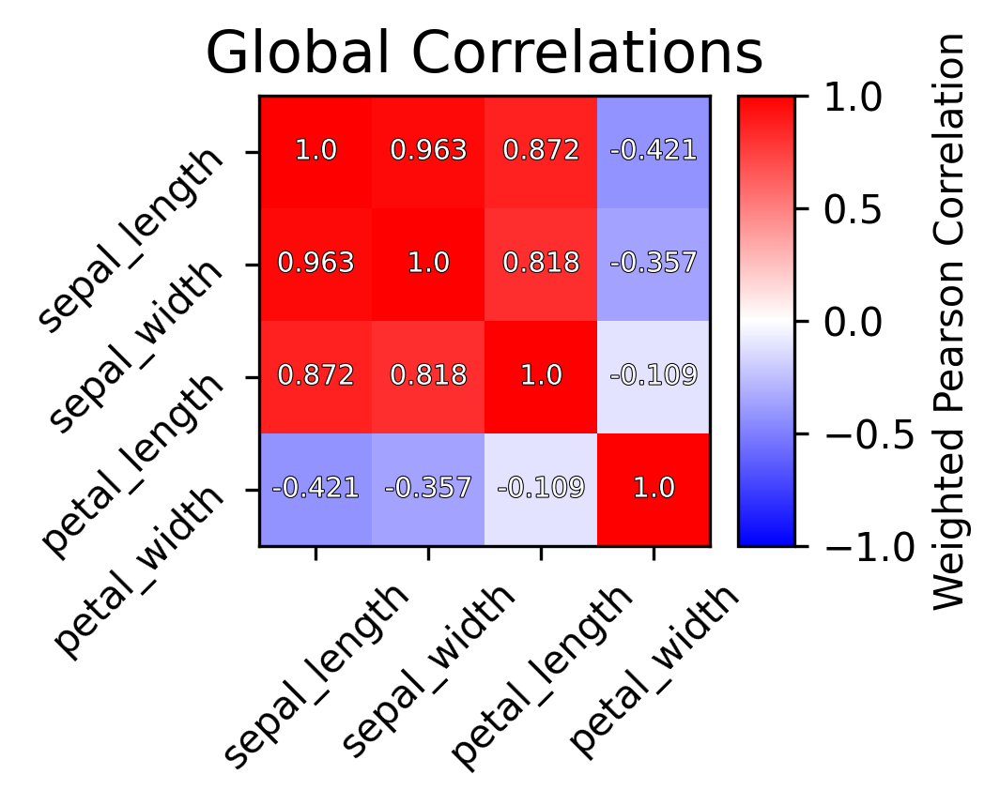

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/4/
Summarizing:5
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[11.82816479  3.50174627 43.43359011 10.35774112],A:[13.13986892  3.55498431 44.52902508 10.42261618]
Error ratio: [0.90723364 0.98831213 0.97593985 0.99432047]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


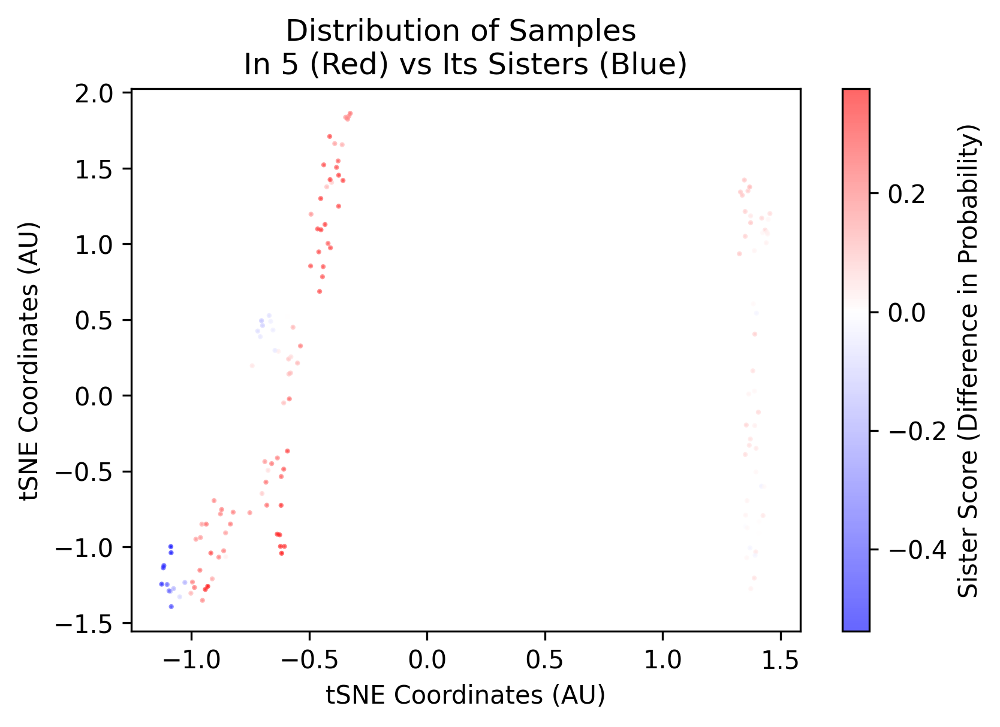

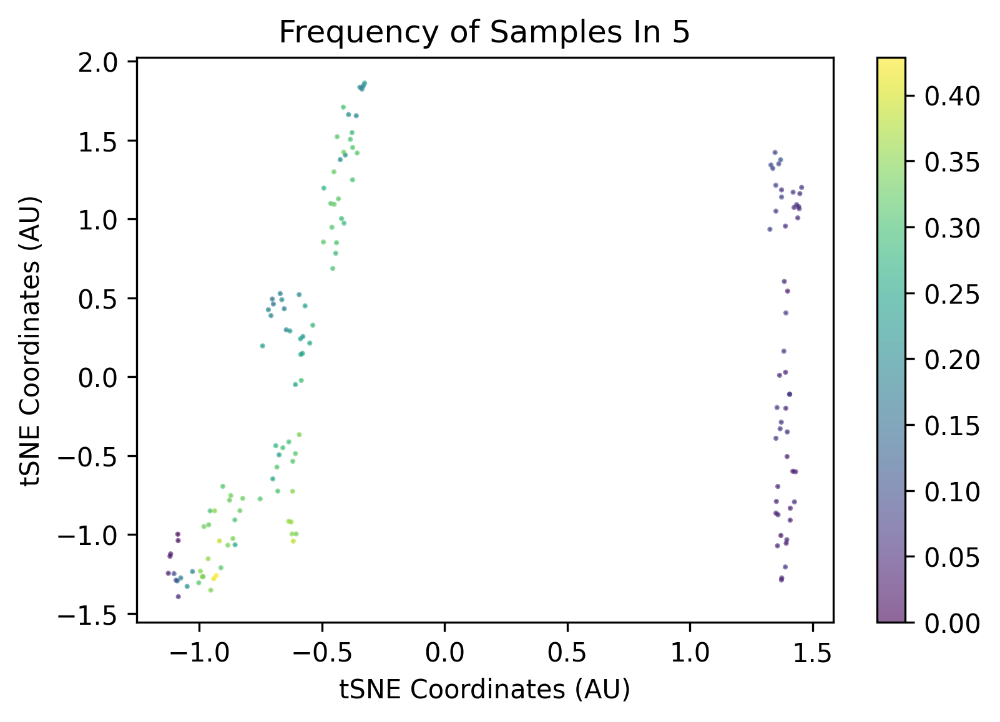

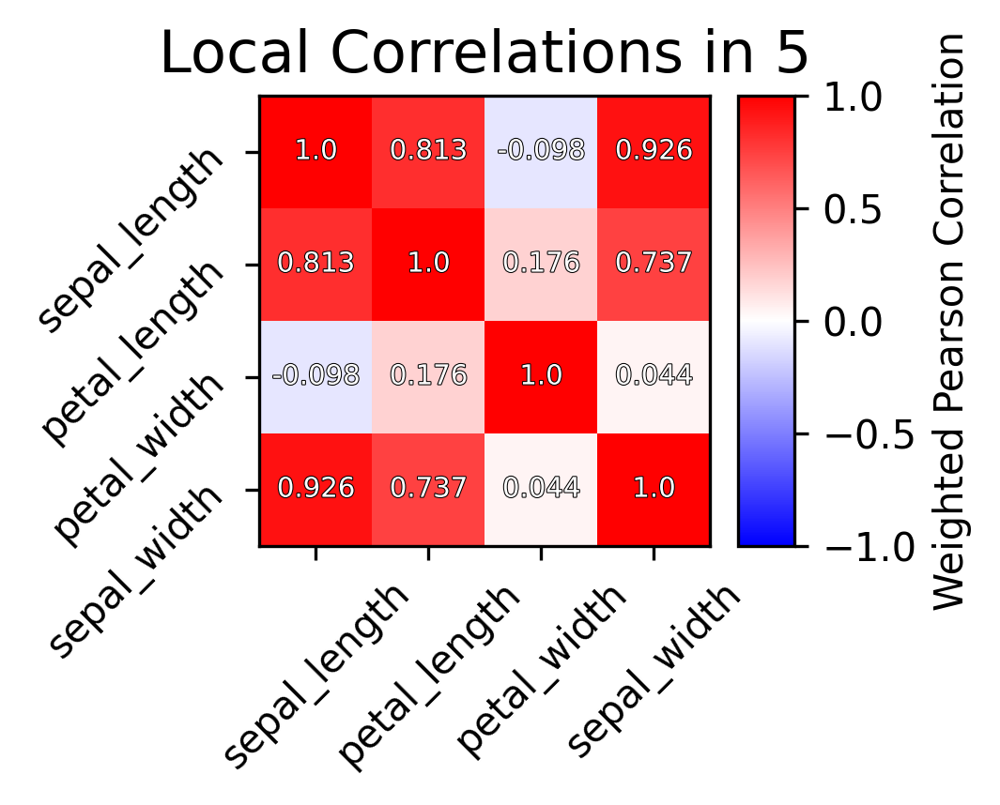

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


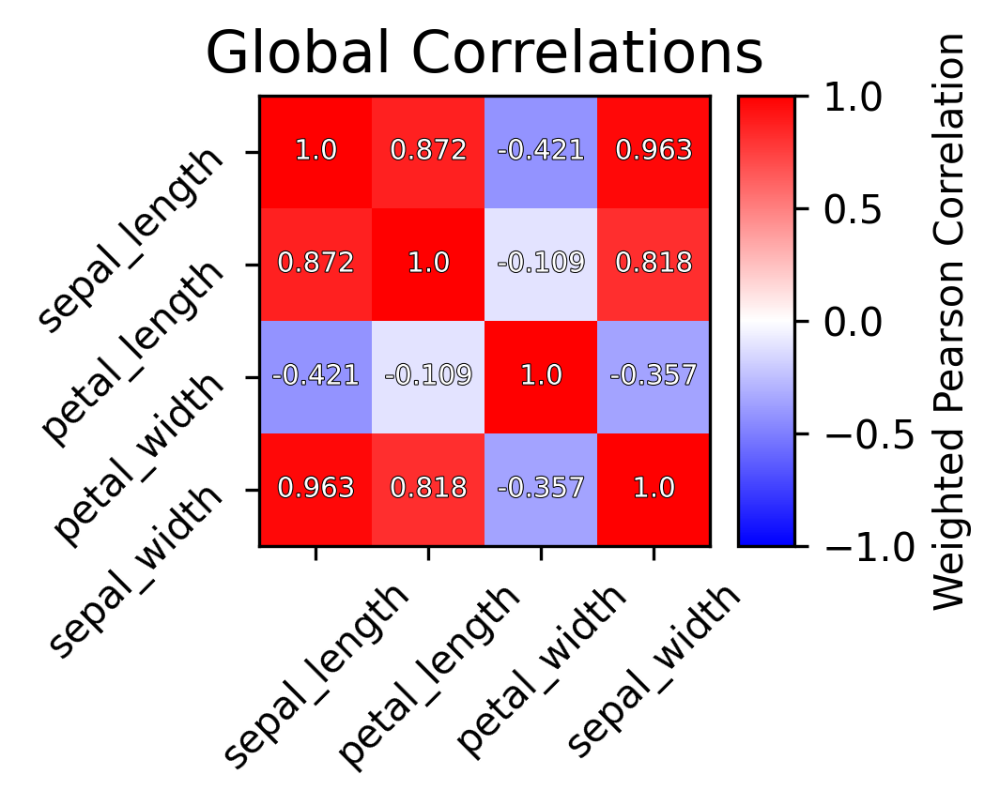

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/5/
Summarizing:6
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[ 9.74154085  2.30917333 28.02969229  5.05591072],A:[12.03738353  2.32962423 30.14377717  5.17638711]
Error ratio: [0.82390311 0.99385789 0.93211855 0.98049404]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


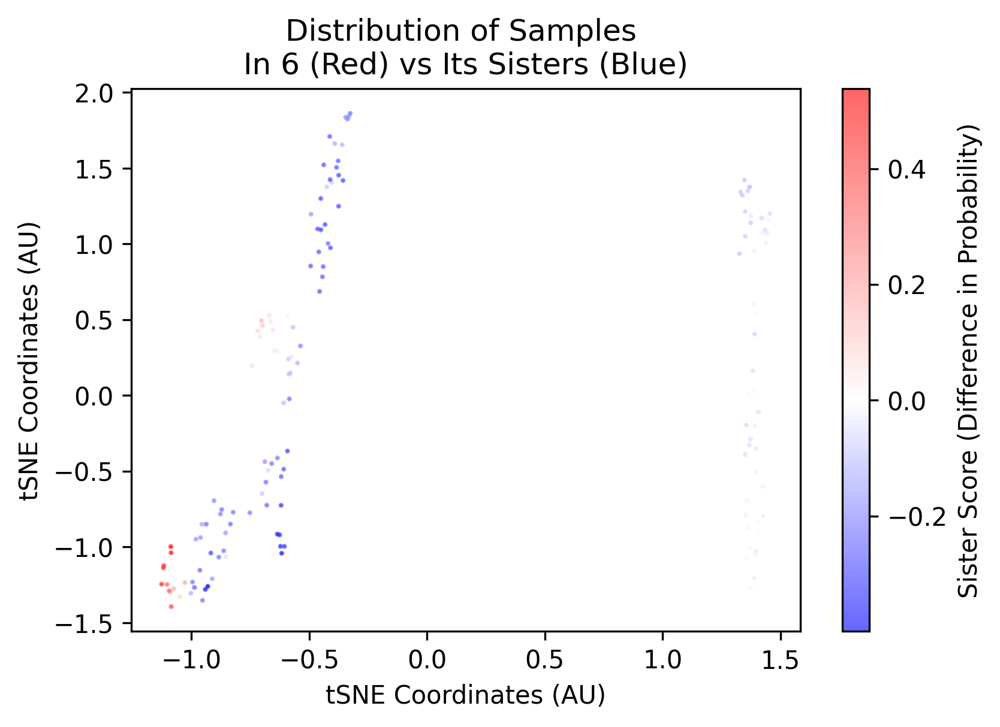

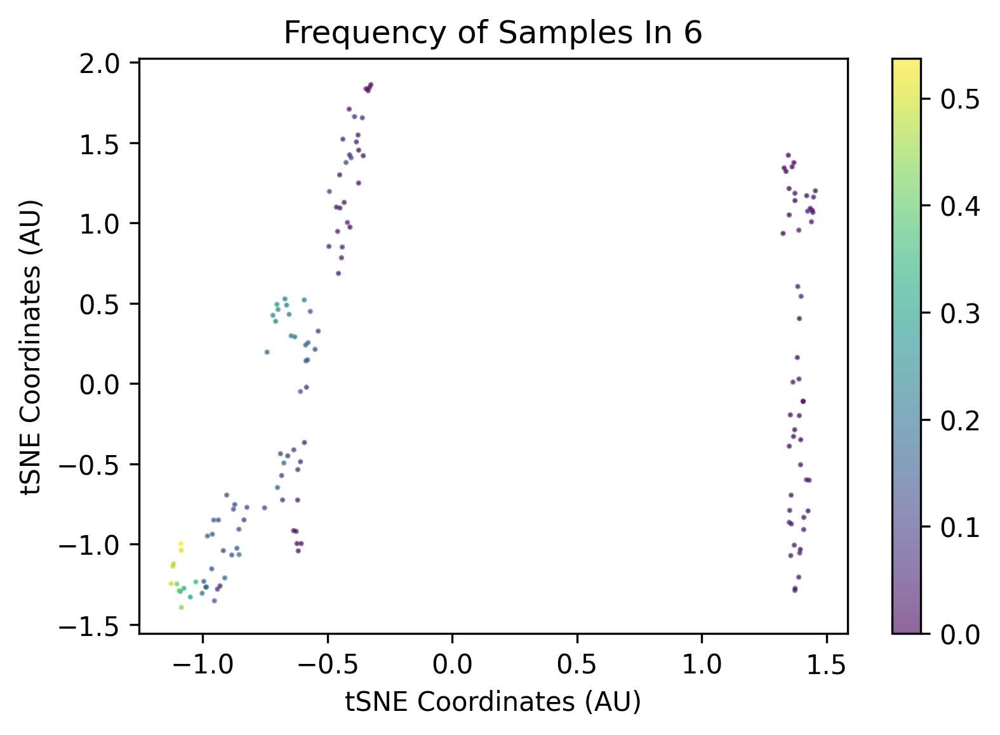

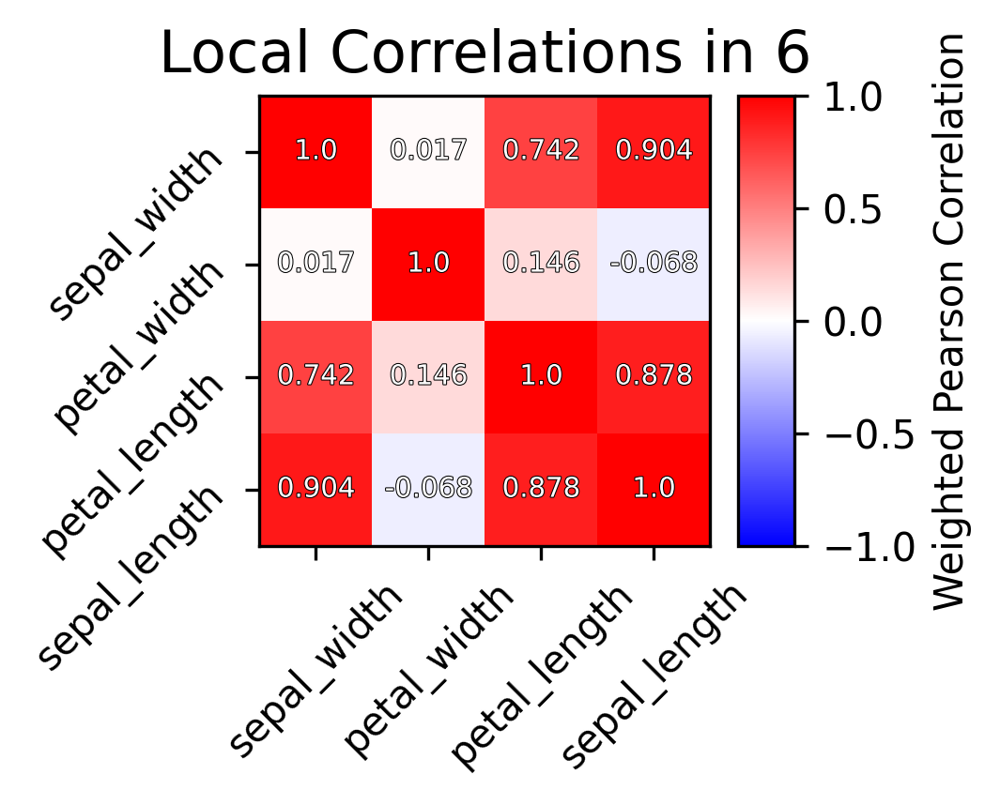

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


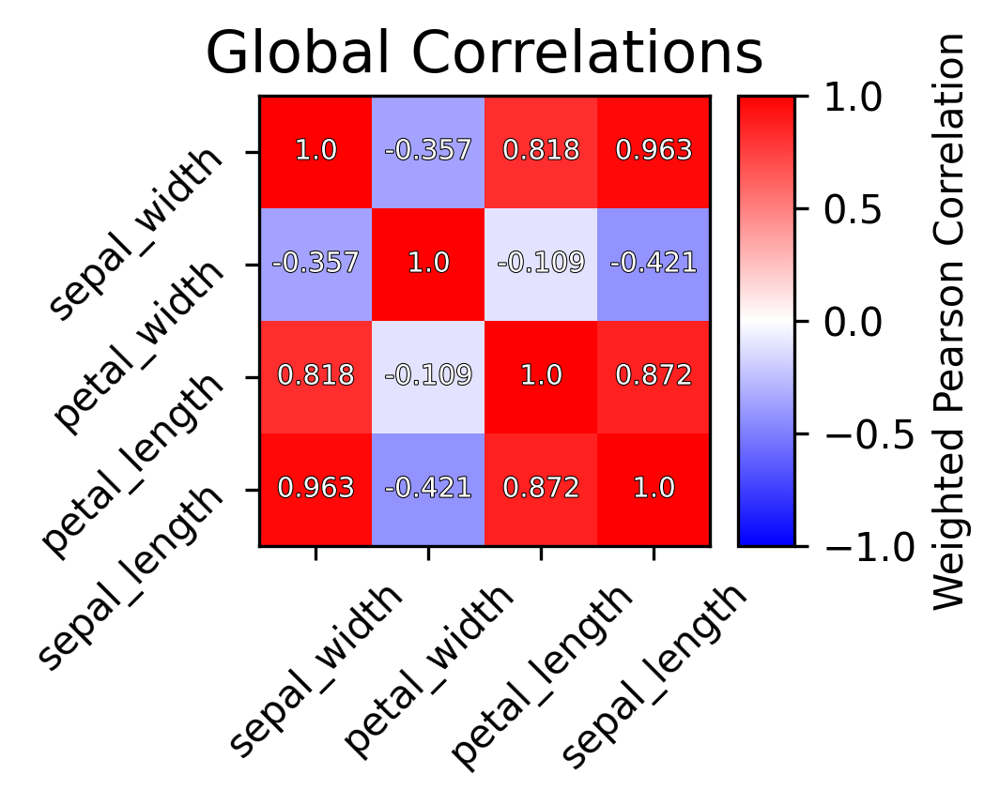

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/6/
Summarizing:7
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[10.25015054  2.55931325 26.43257719  5.93578538],A:[13.59515313  2.55466399 44.00210695  9.71783506]
Error ratio: [0.77081415 1.00130793 0.60958428 0.64712559]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


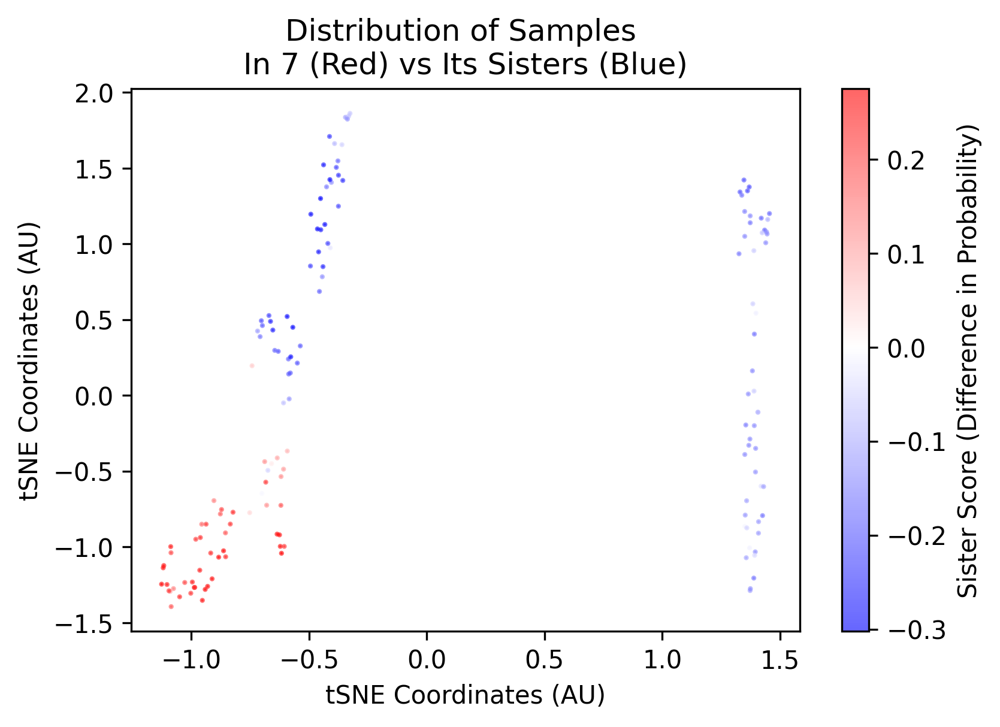

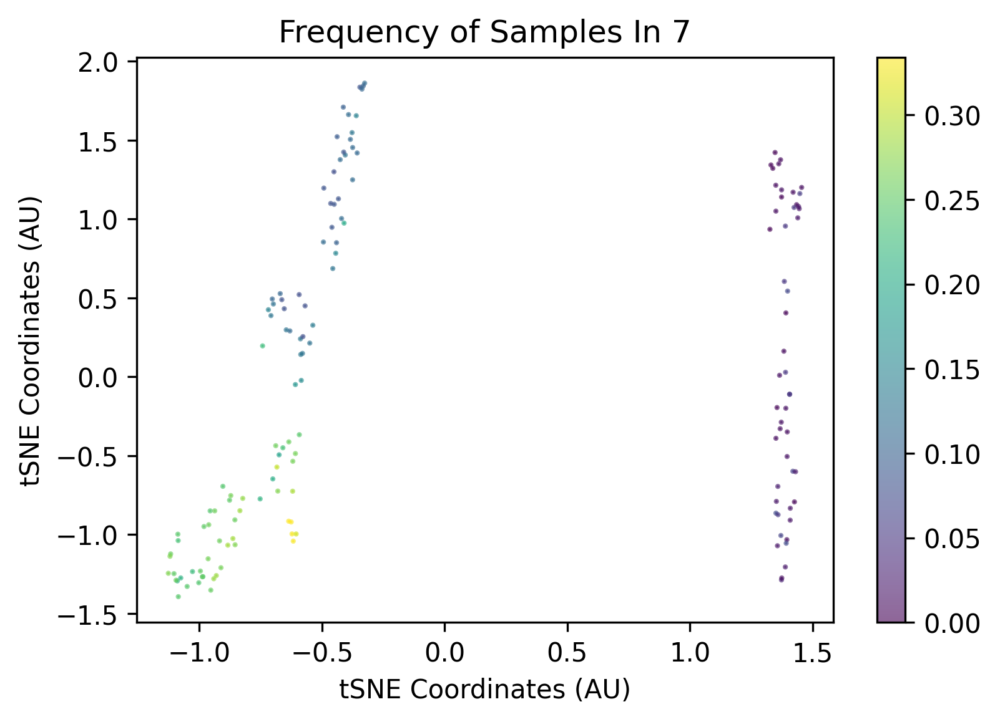

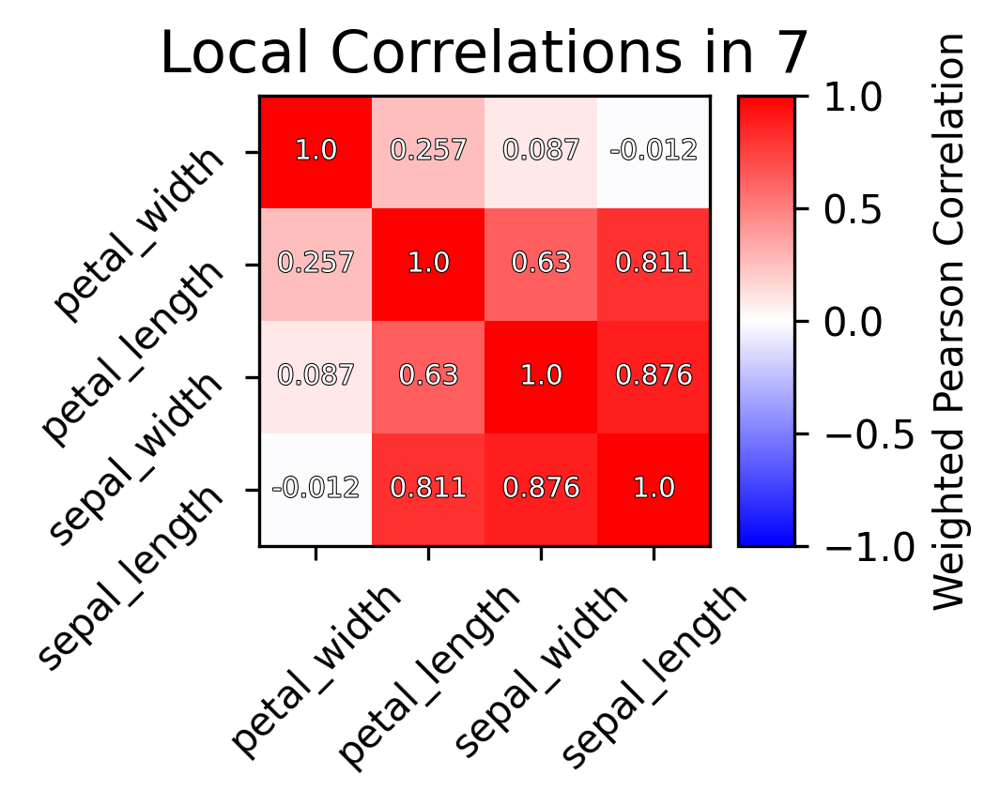

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


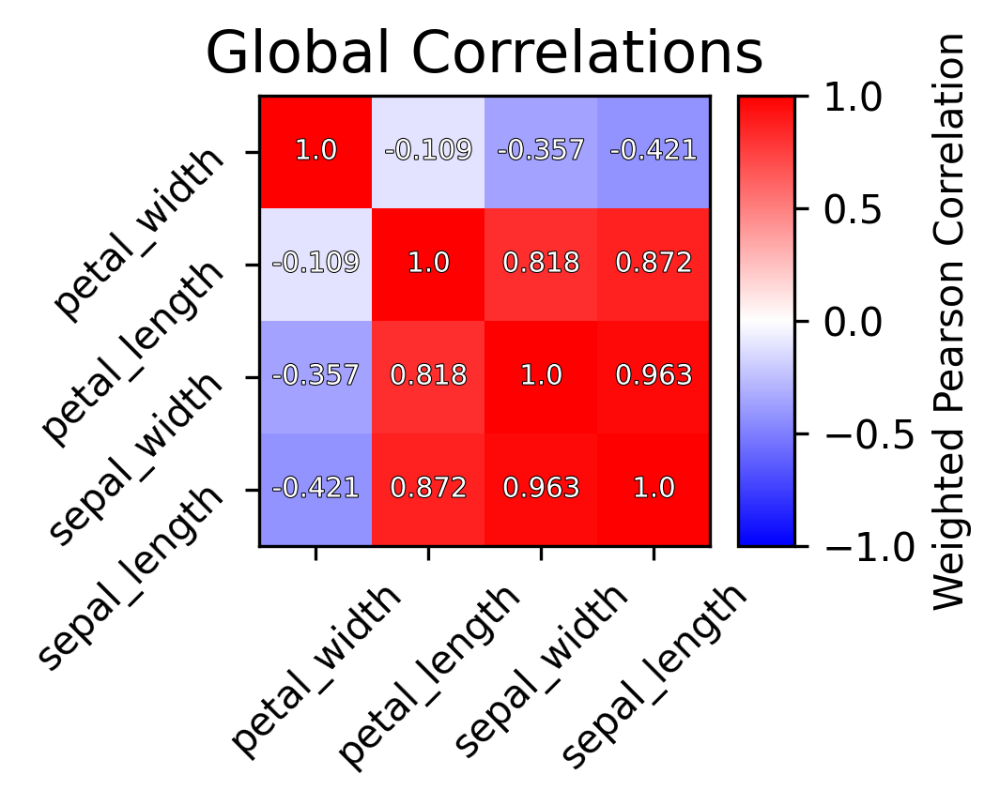

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/7/
Summarizing:8
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[4.91513817 4.95130539 7.71368183 1.50361216],A:[ 5.45989377  6.43689254 20.01680907  3.48113655]
Error ratio: [0.91567112 0.80024087 0.41460537 0.55870026]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


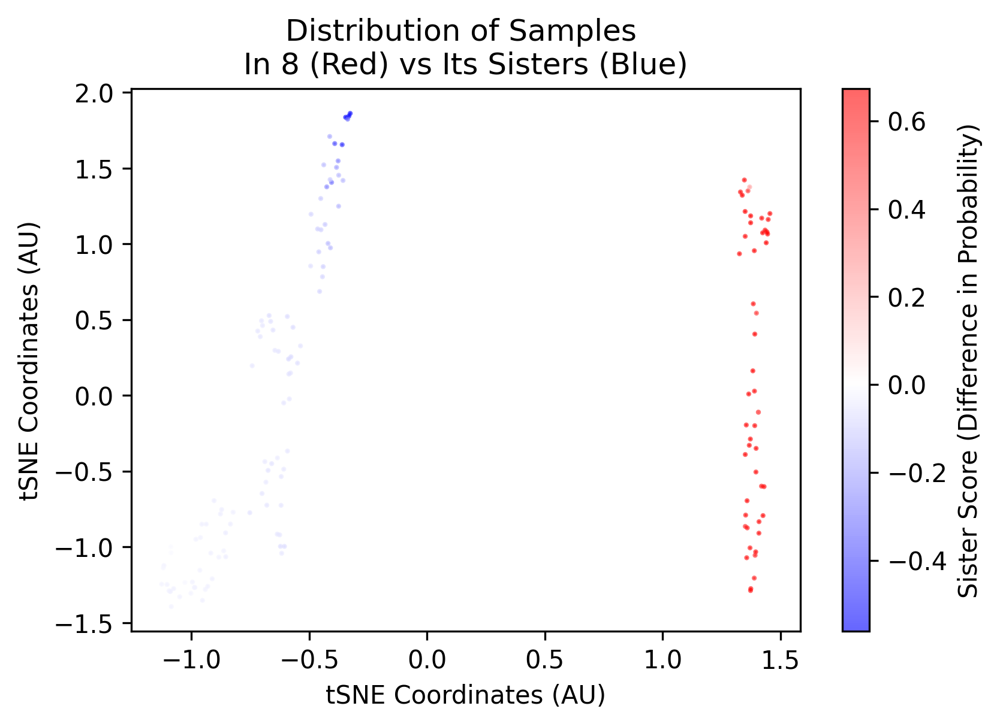

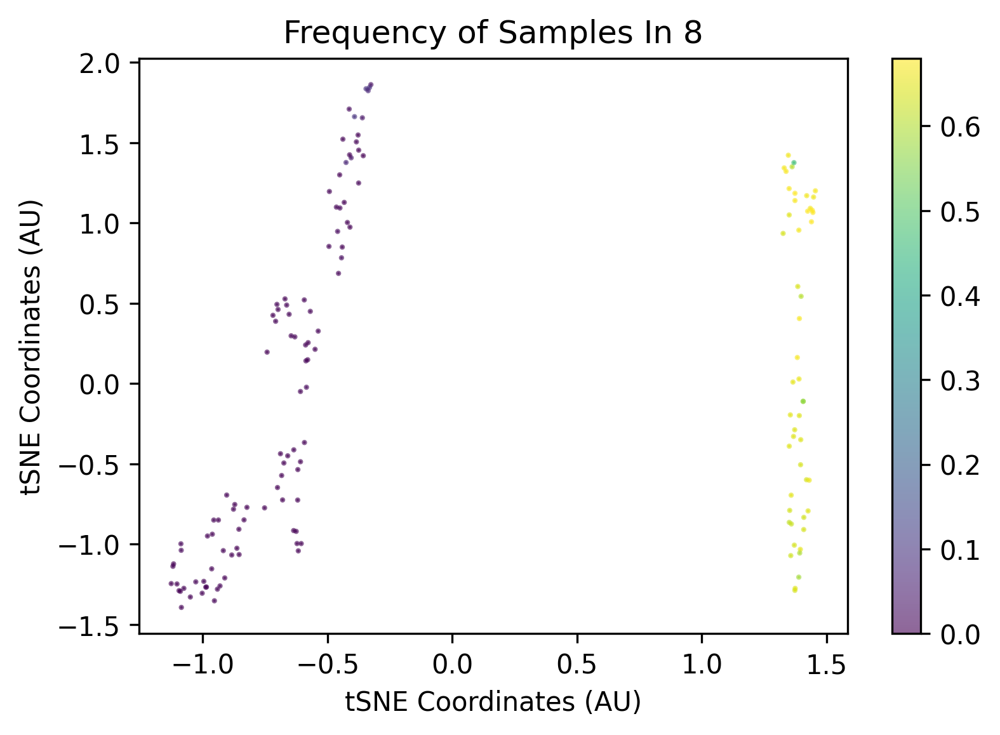

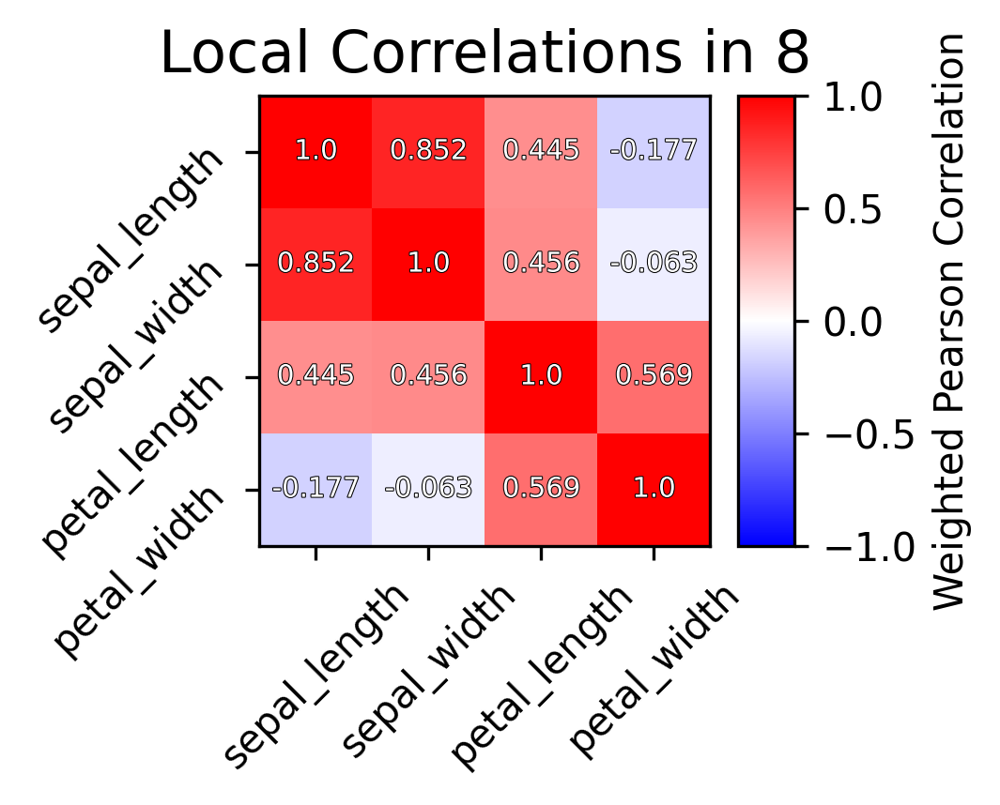

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


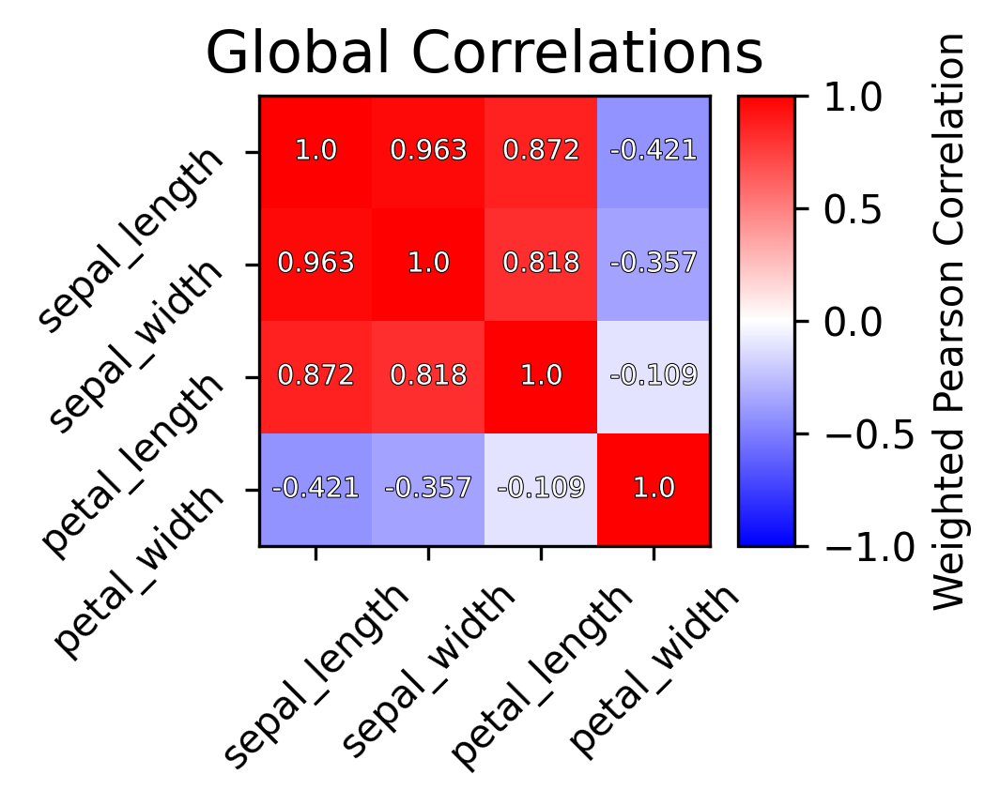

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/8/
Summarizing:9
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[18.2925665   5.03379268 66.21988867 12.04245432],A:[19.23845661  5.50298446 67.62470909 12.77967289]
Error ratio: [0.95326273 0.92784978 0.97952894 0.94649956]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


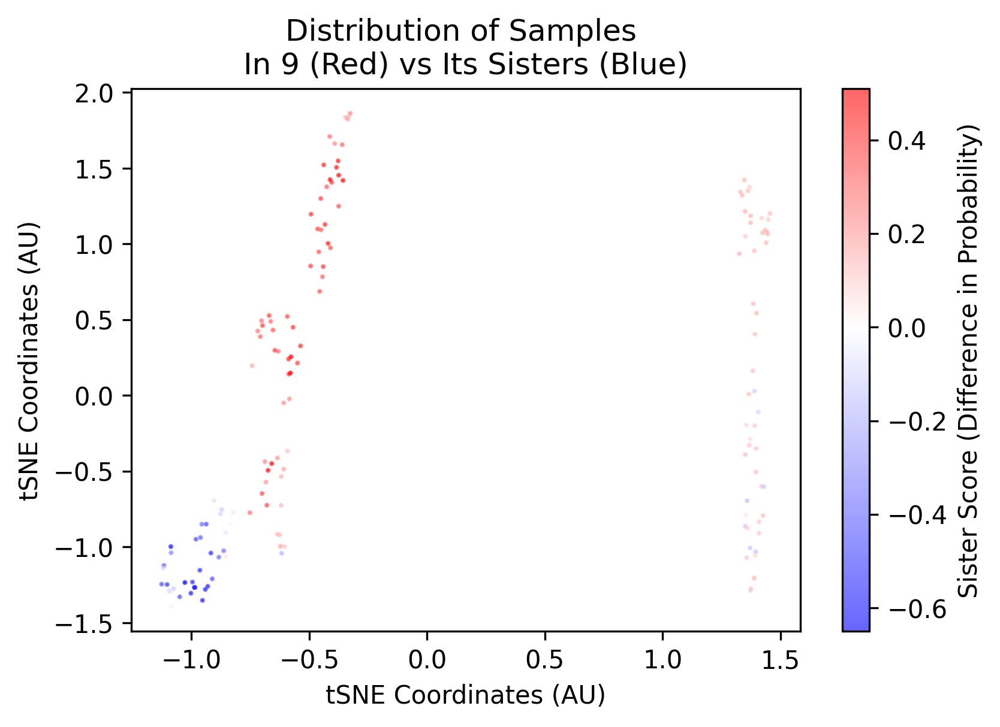

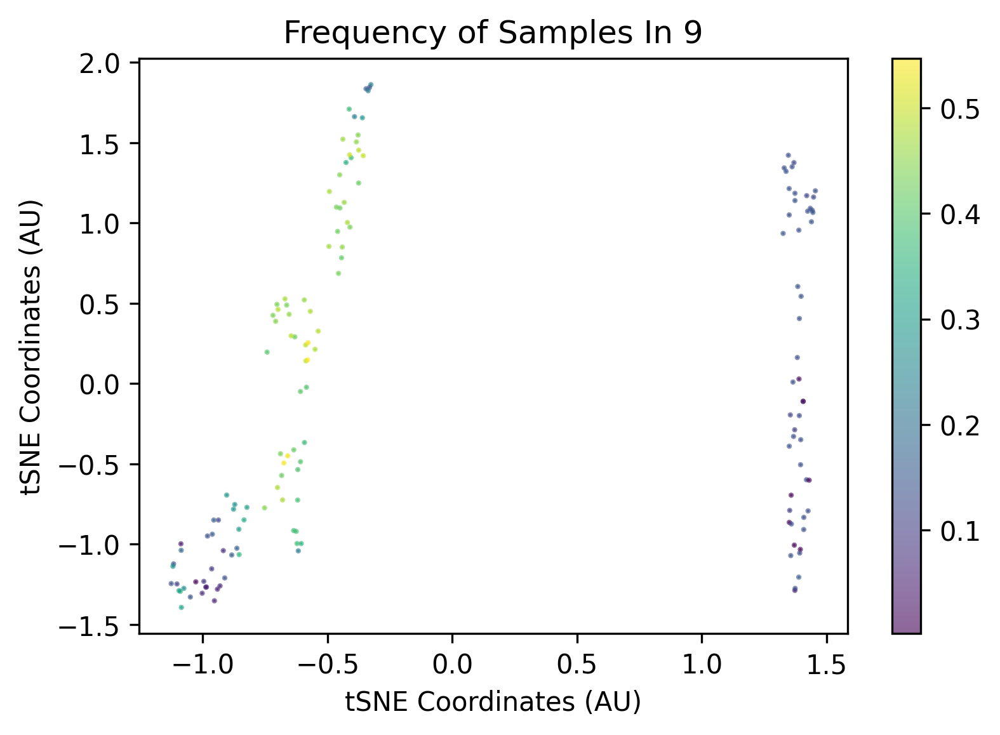

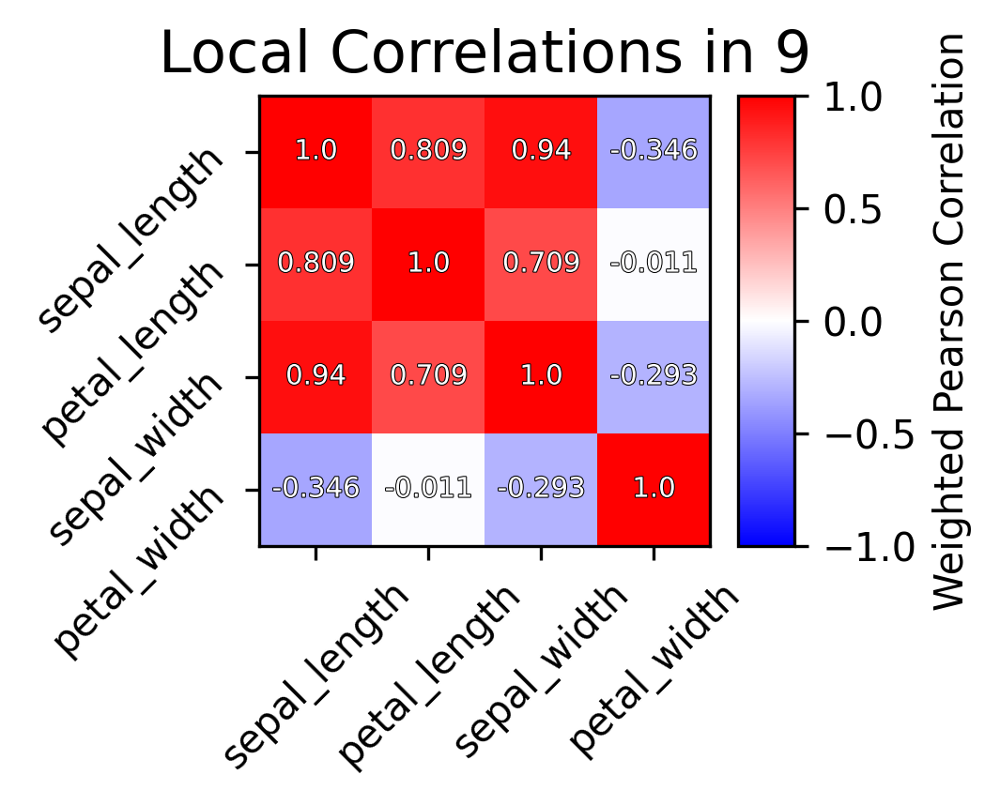

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


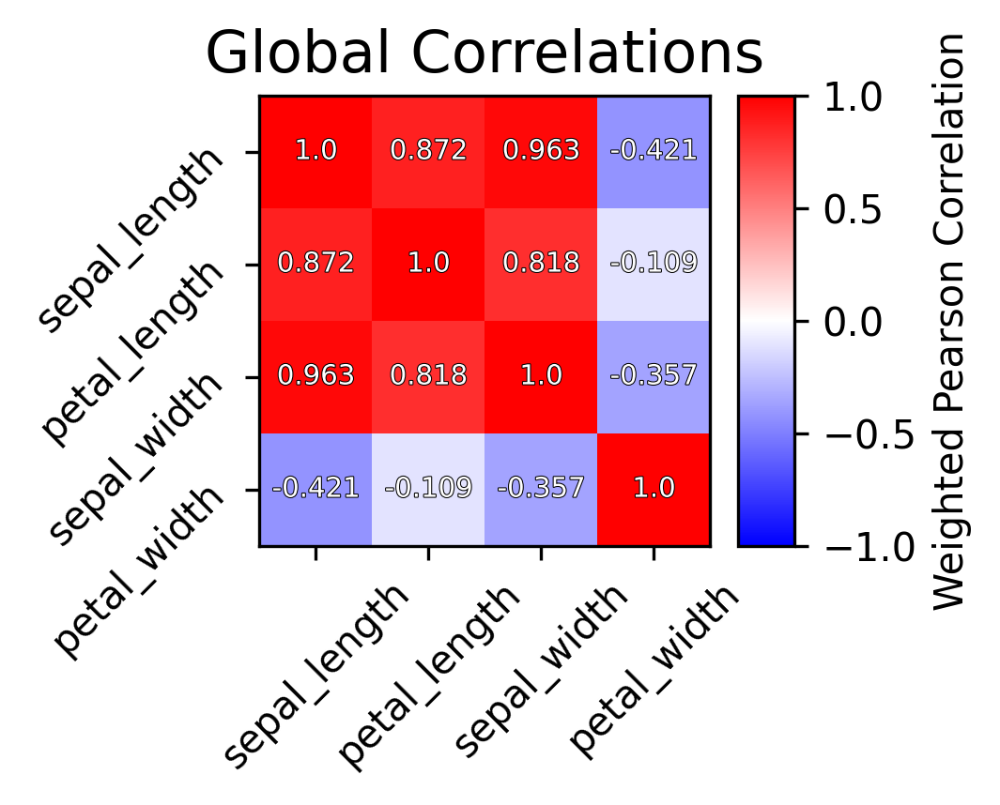

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/9/
Summarizing:10
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[11.41920343  4.62501522 51.96589599  8.36947365],A:[11.71535422  4.6197742  54.77794967  9.32751151]
Error ratio: [0.9767092  1.0009326  0.94958485 0.90723439]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


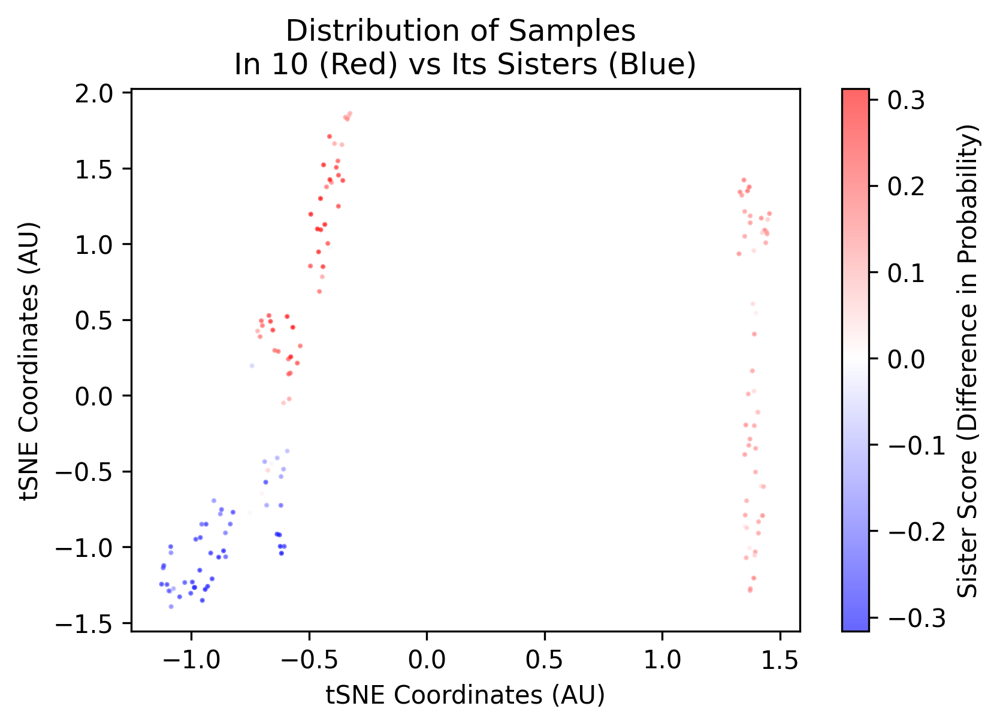

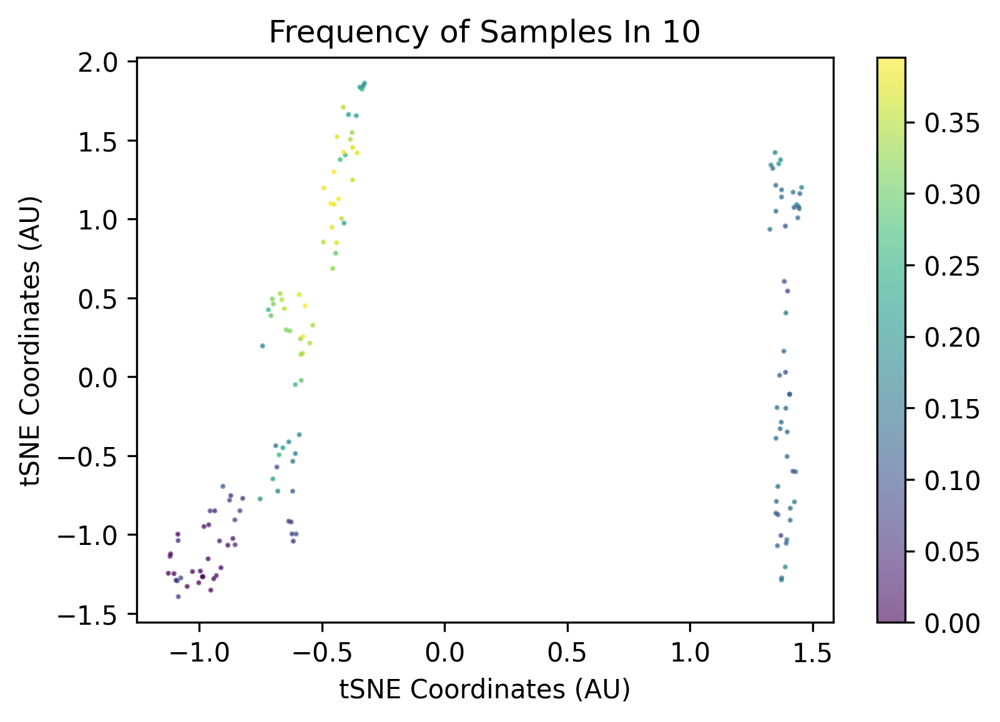

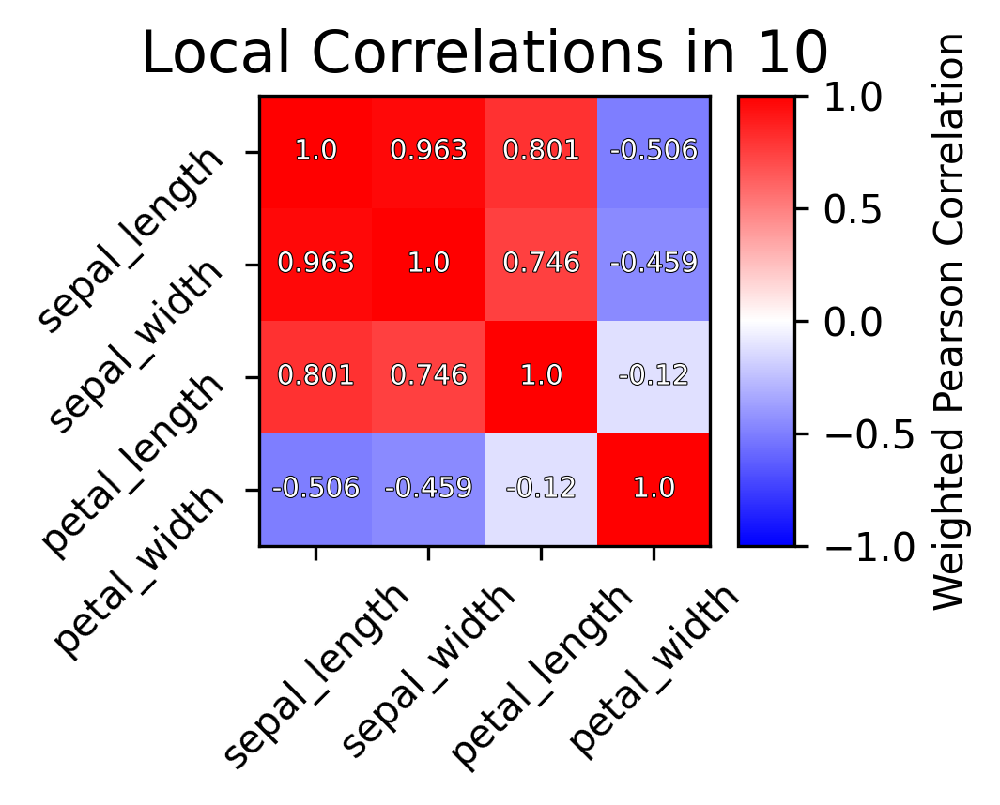

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


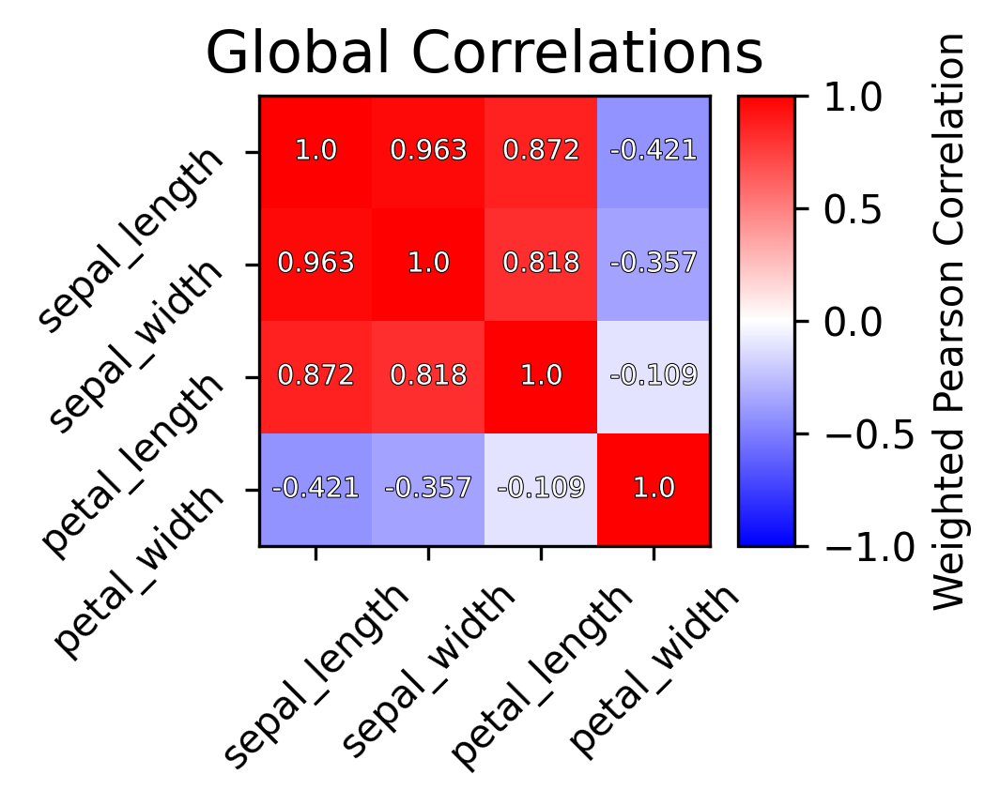

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/10/
Summarizing:11
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[ 6.32604939  1.87035029 17.74845061  3.21565568],A:[ 7.40111224  4.38508442 47.21627976  8.04386804]
Error ratio: [0.87203327 0.53301862 0.38884067 0.46613414]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


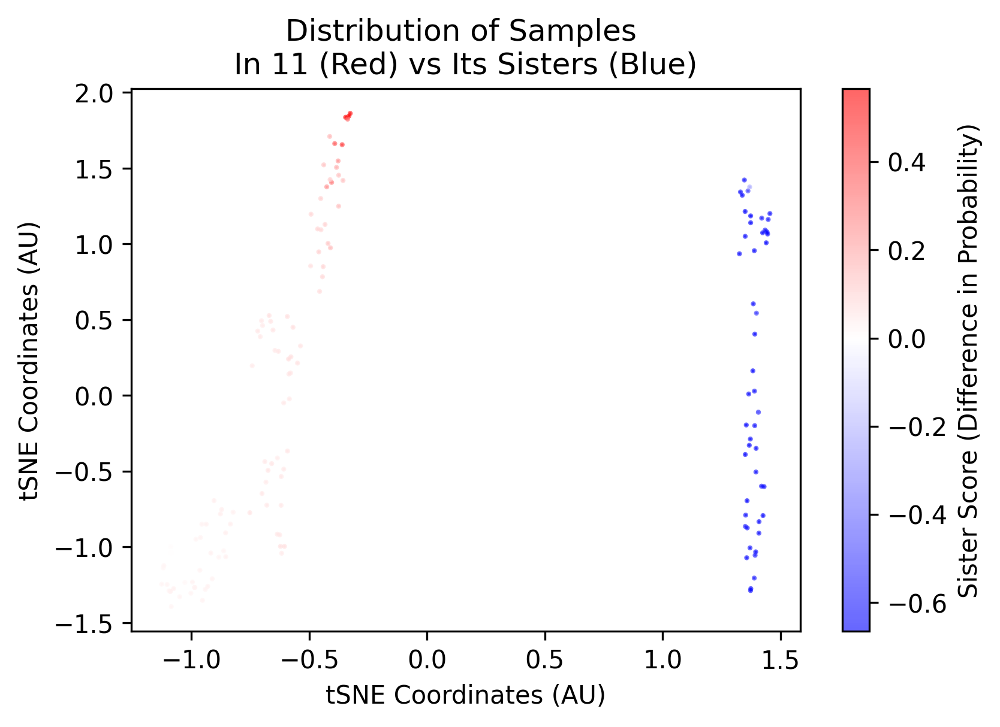

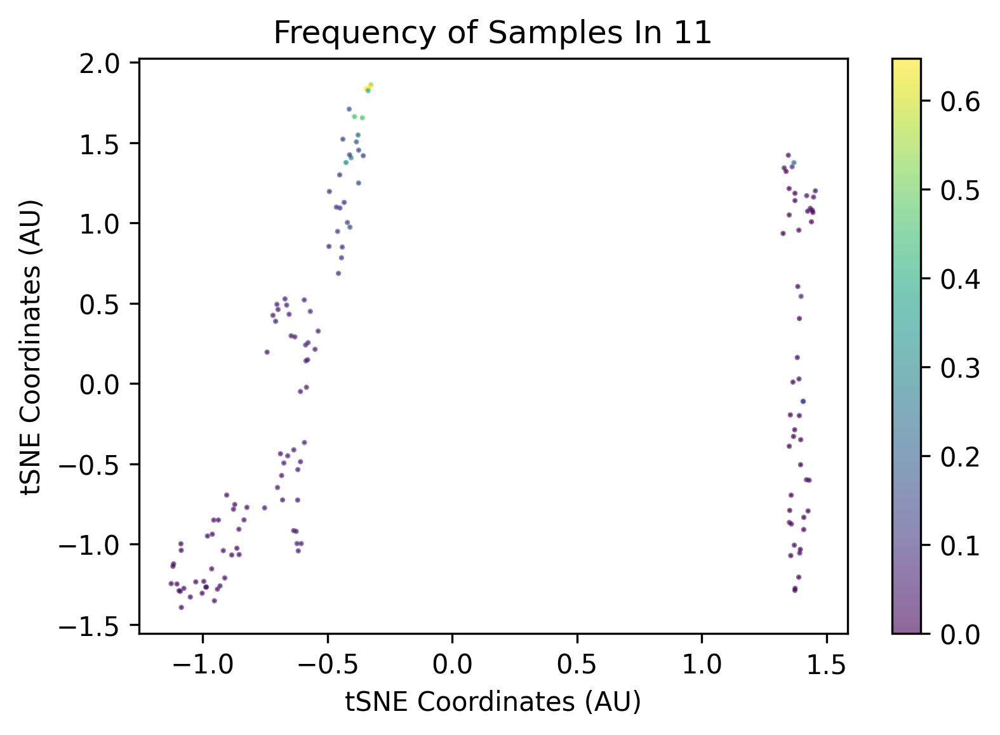

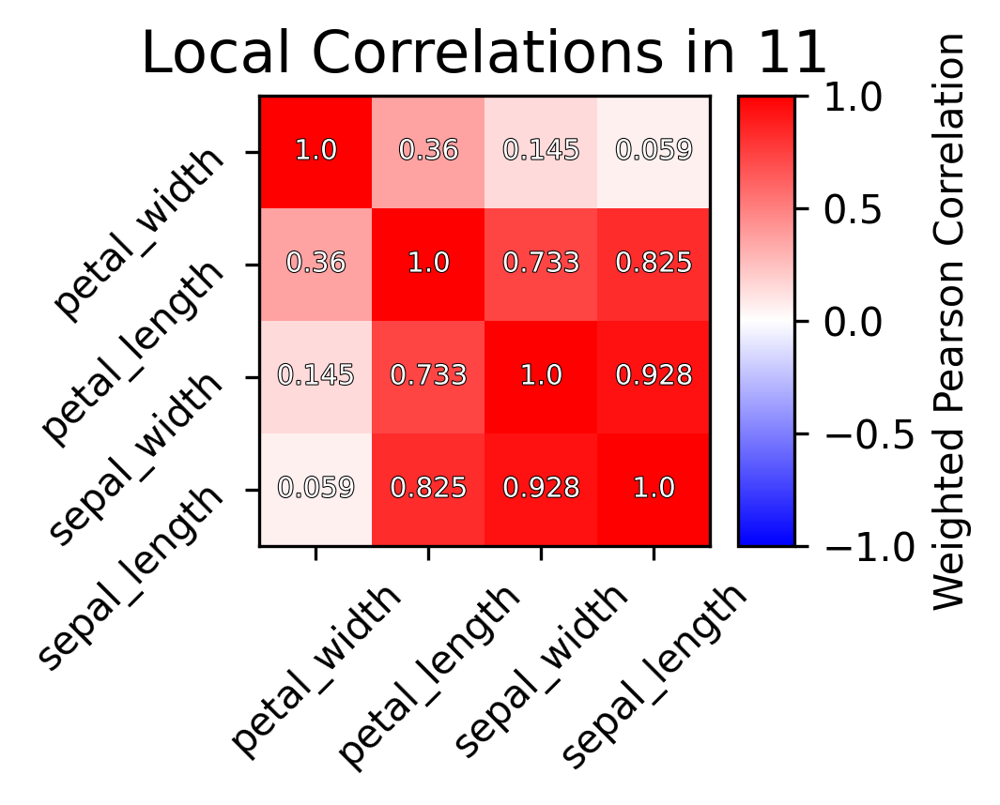

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


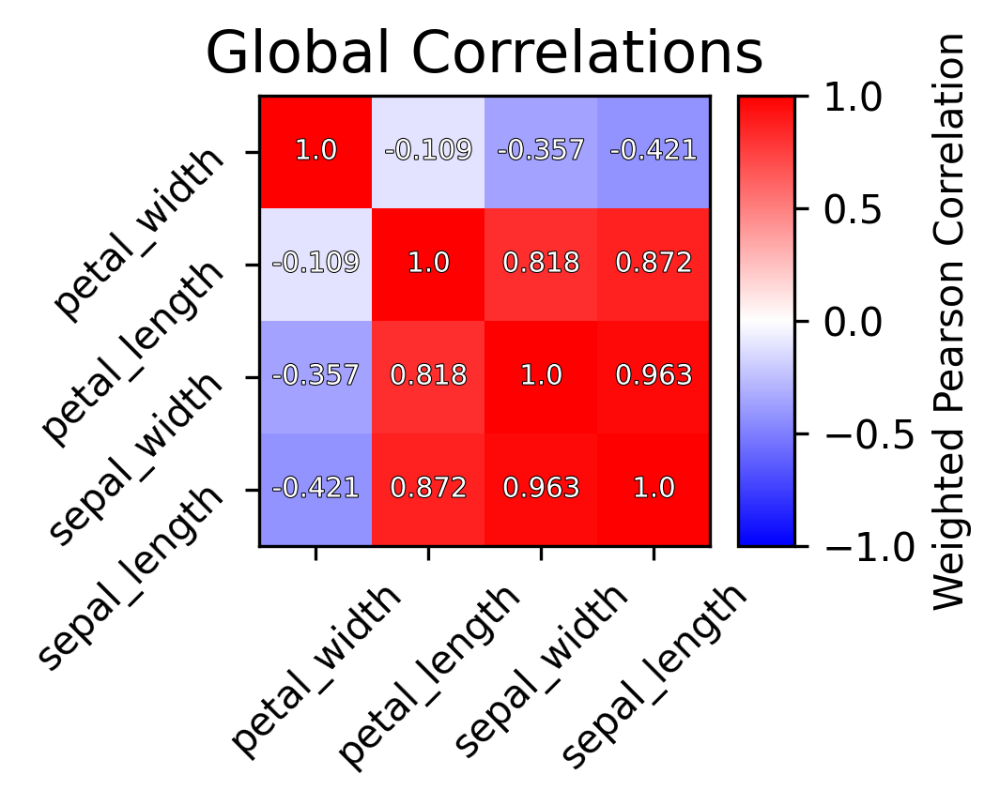

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/11/
Summarizing:12
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[12.8478014   3.26229079 37.31250142  7.30624915],A:[16.54835932  3.28426345 49.71226515 11.43365502]
Error ratio: [0.78912228 0.99487131 0.75548787 0.66804565]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:587: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


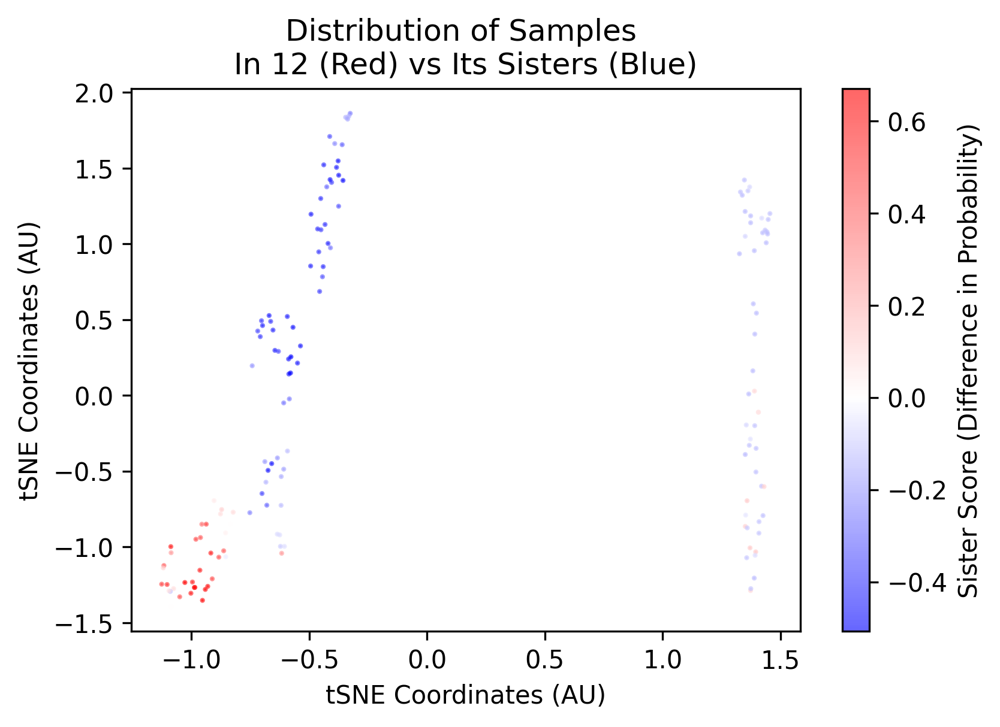

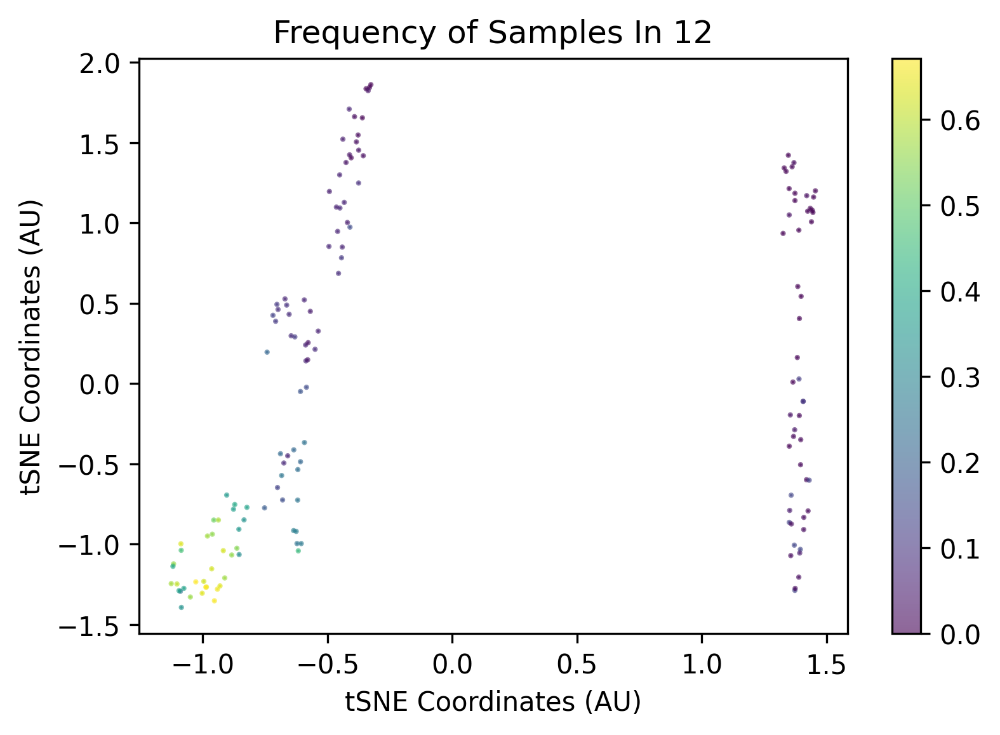

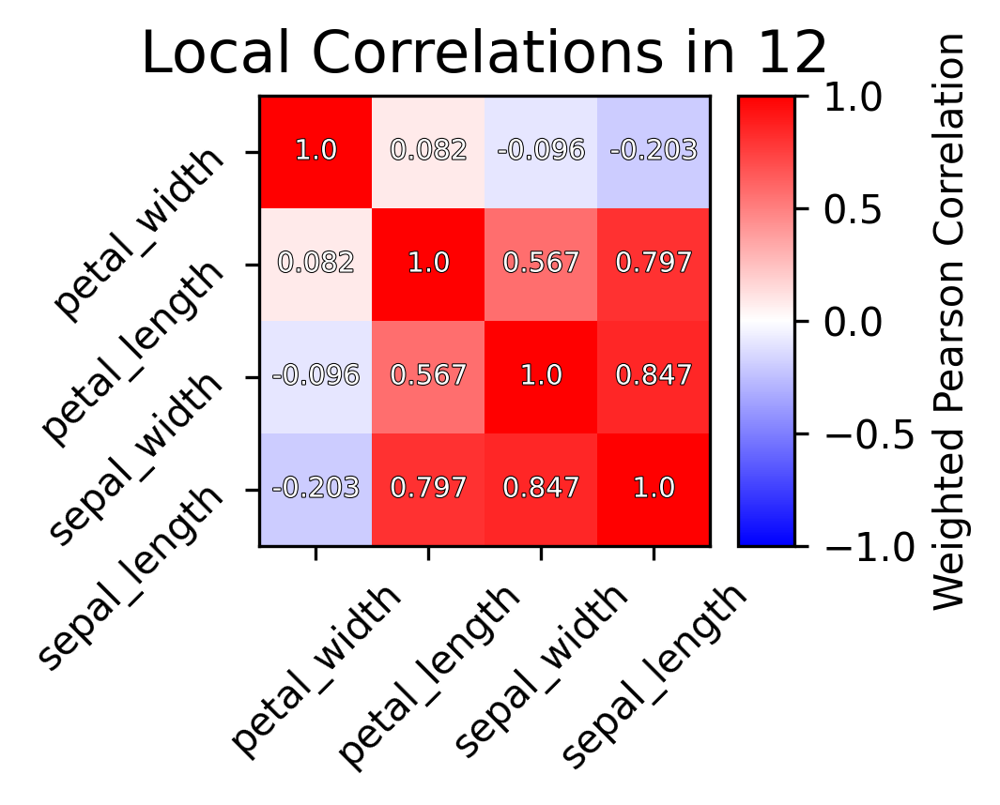

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:617: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


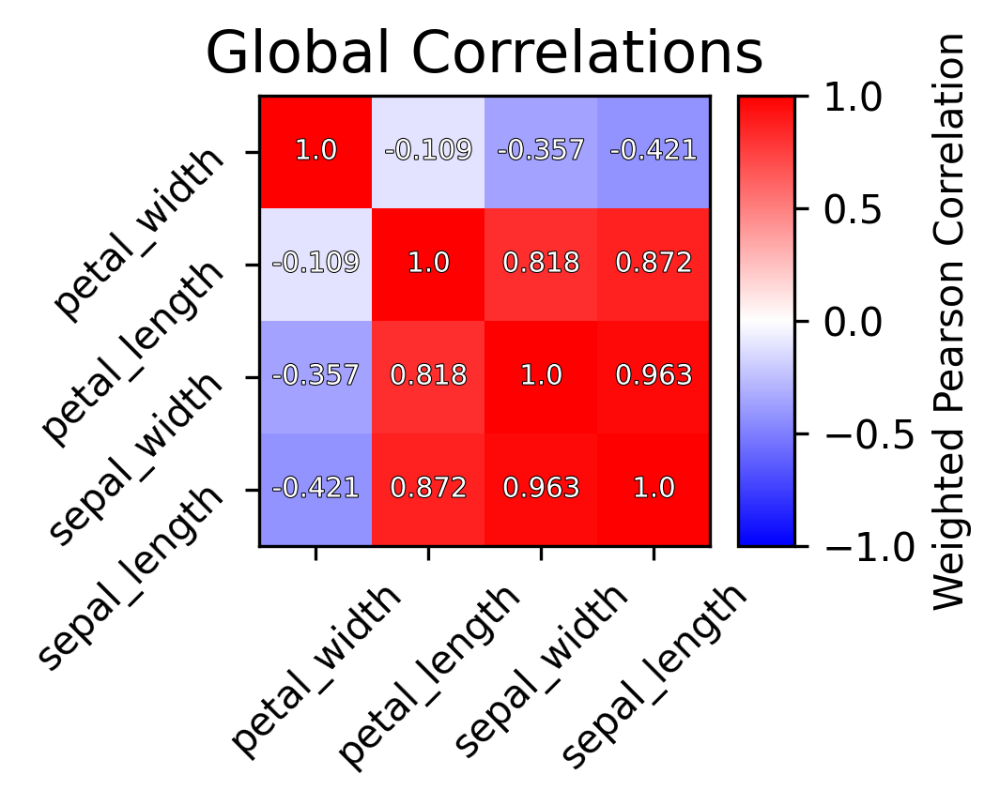

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/12/


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


Error: P:[101.96440452  27.95668663 462.93785762  86.60652029],A:[nan nan nan nan]
Error ratio: [nan nan nan nan]
Generating top local


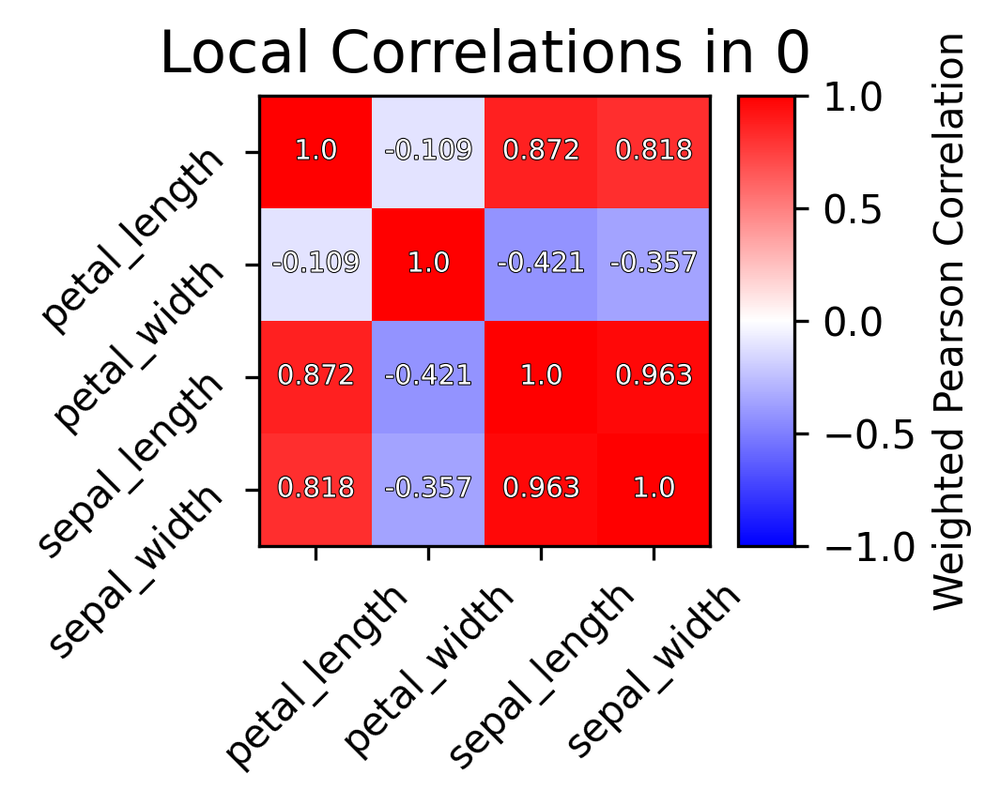

Generating top global


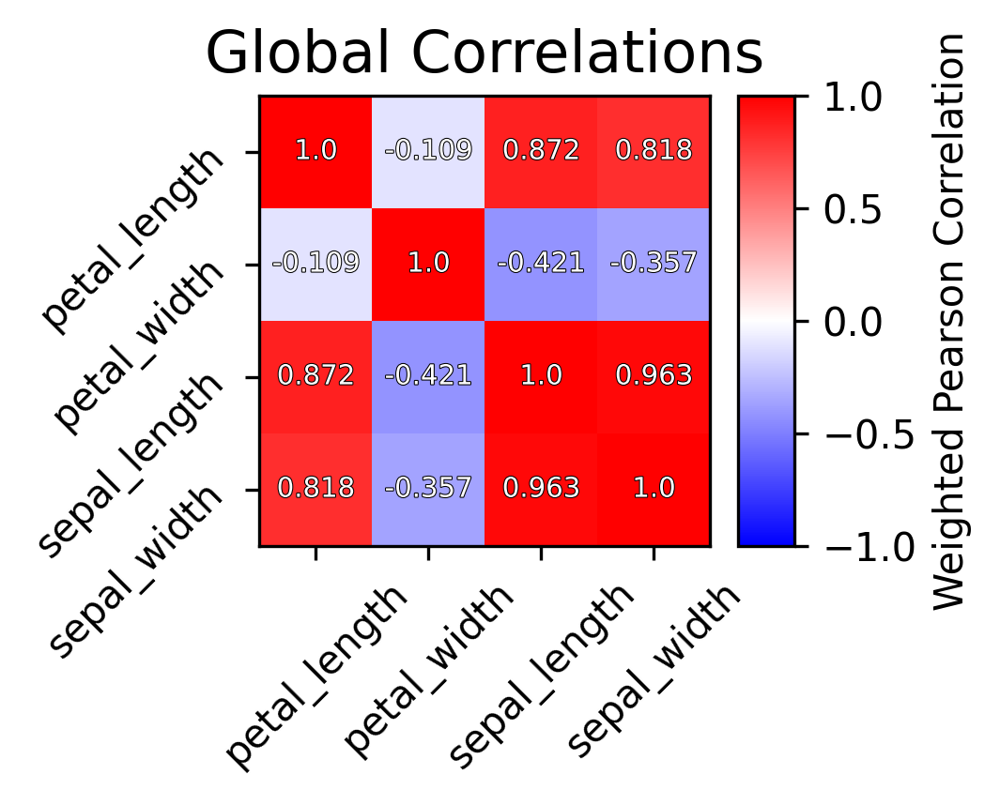

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/0/
Error: P:[16.33248145  4.53906388 93.56756061 17.55423938],A:[18.09953817  4.87179269 92.225792   17.49245029]
Error ratio: [0.9074817  0.94333437 1.01439268 1.00334131]
Generating top local


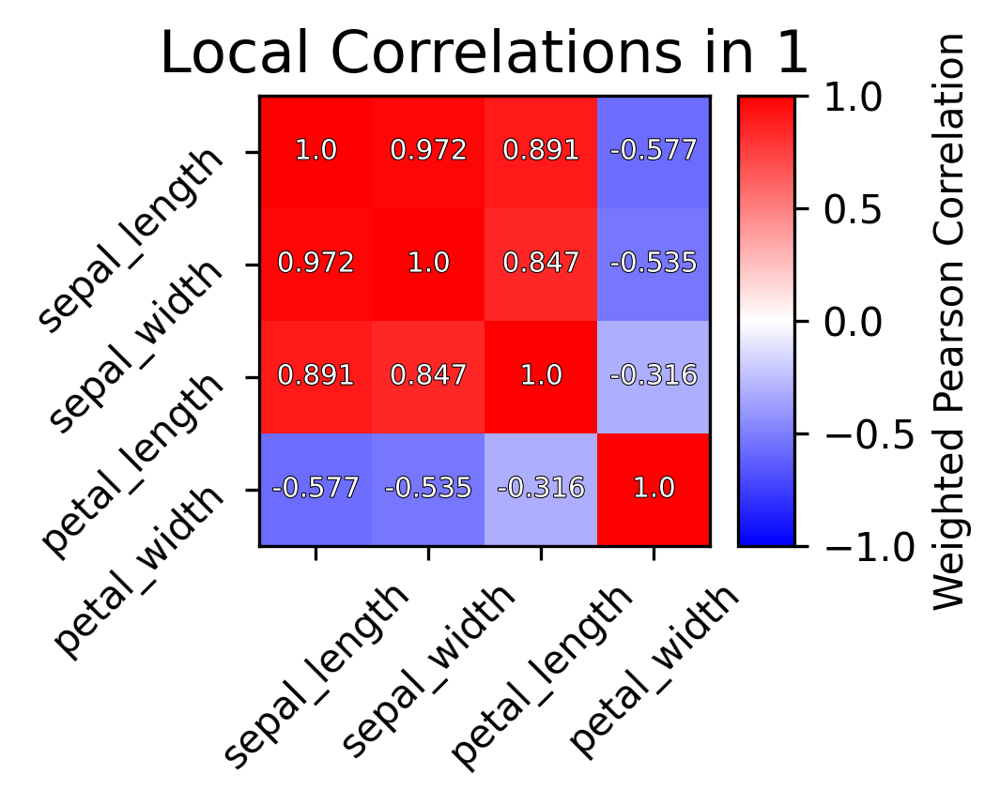

Generating top global


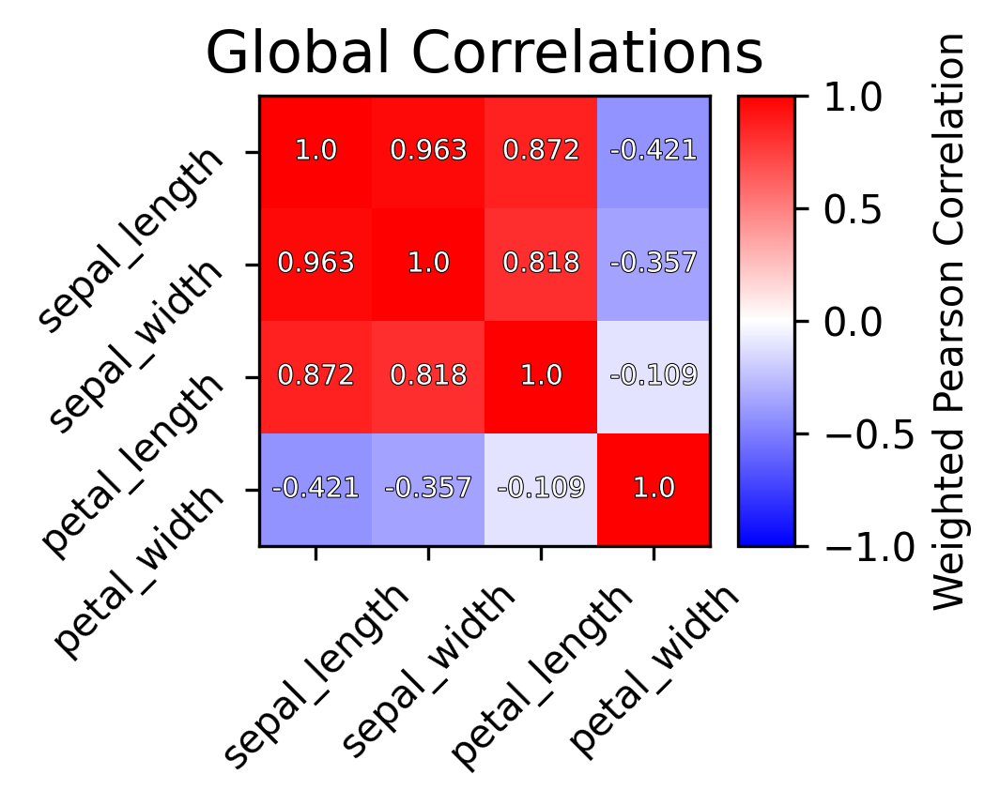

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/1/
Error: P:[ 23.52371585   4.71815575 108.50546068  19.38225614],A:[ 22.32107236   6.74136879 109.48333764  19.34465614]
Error ratio: [1.05156896 0.73864919 0.9911491  1.00184815]
Generating top local


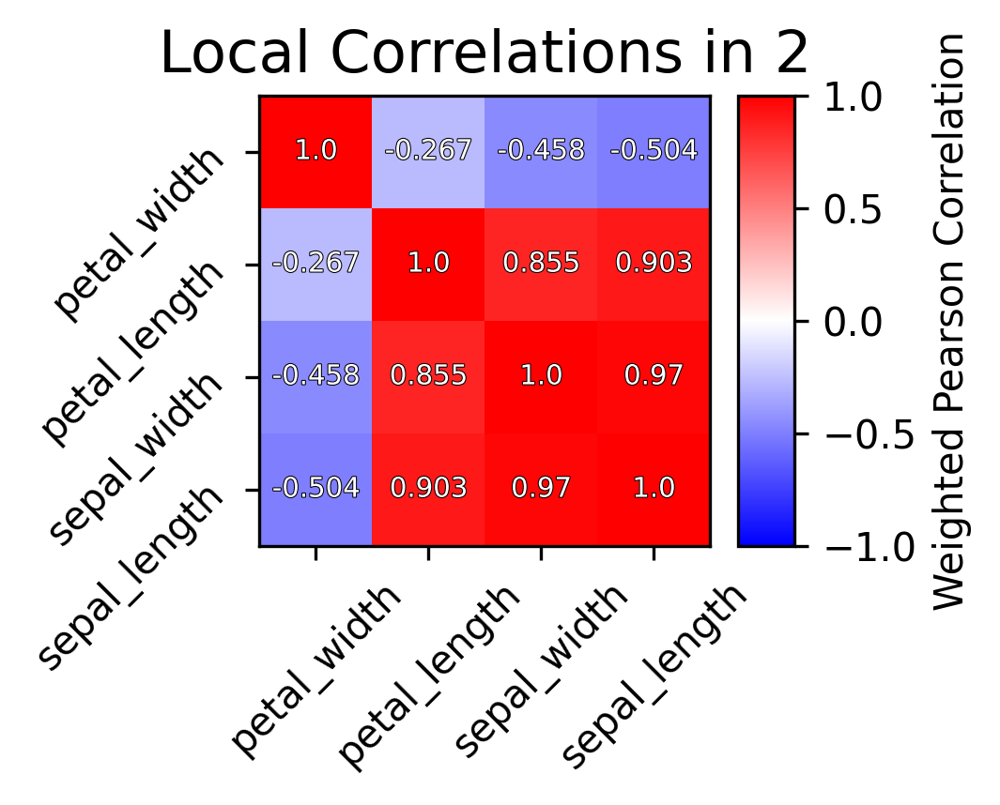

Generating top global


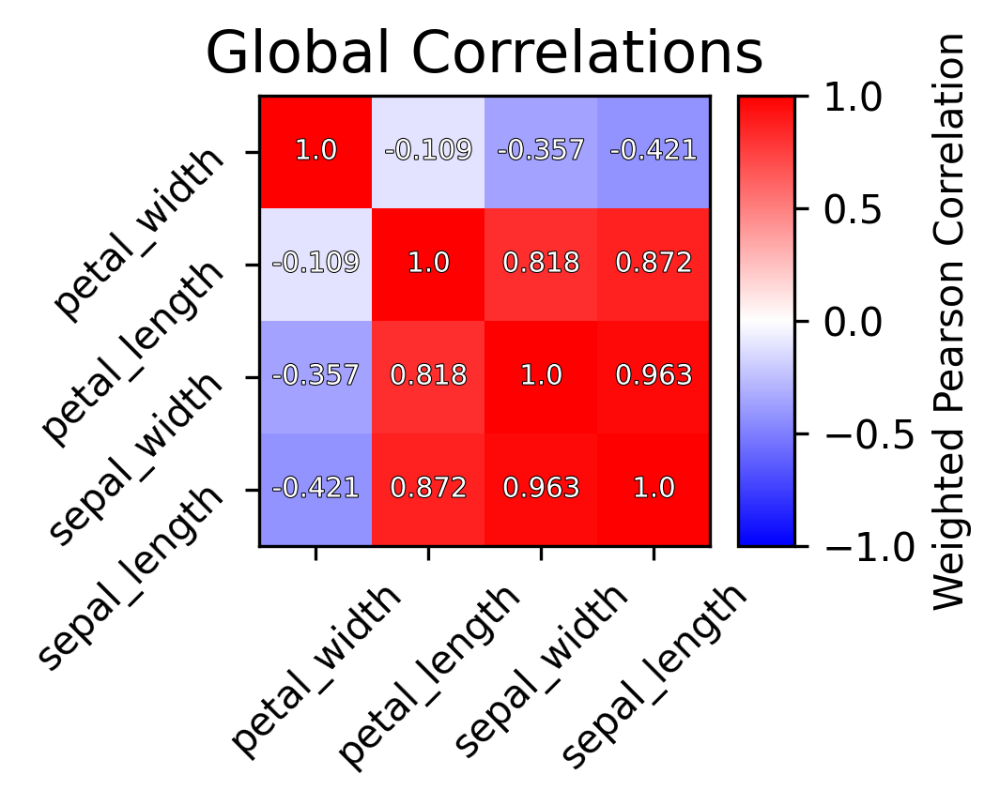

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/2/
Error: P:[29.68248561  8.13387917 54.86037688 13.84538642],A:[ 52.64818259  10.28484842 200.20158158  39.51244733]
Error ratio: [0.57192032 0.80939316 0.27763389 0.36644013]
Generating top local


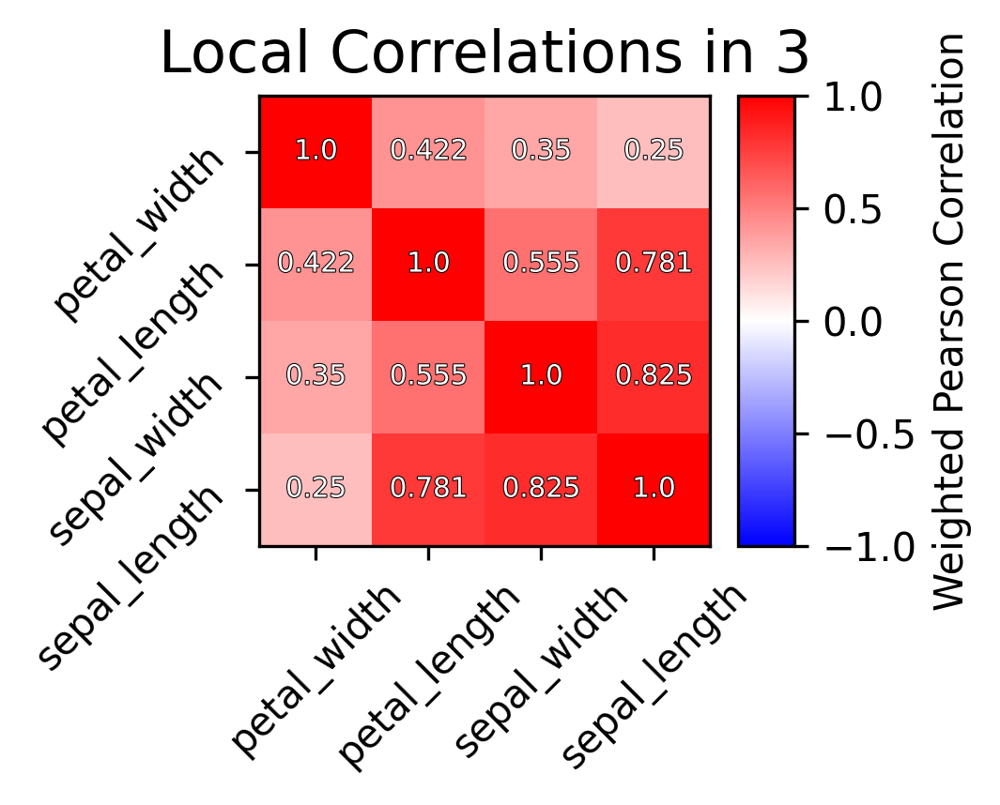

Generating top global


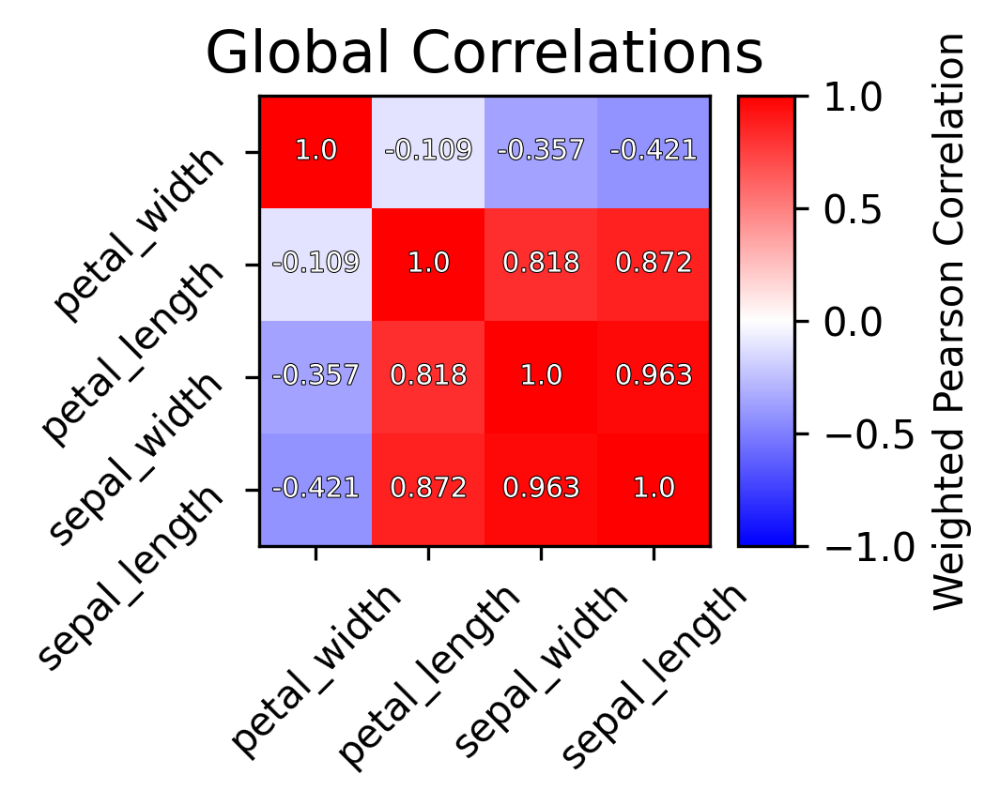

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/3/
Error: P:[10.13789738 12.43337653 56.44024015  9.48775607],A:[ 33.75753607  14.03004896 199.715234    35.04965516]
Error ratio: [0.32044554 0.89376798 0.28617778 0.29092528]
Generating top local


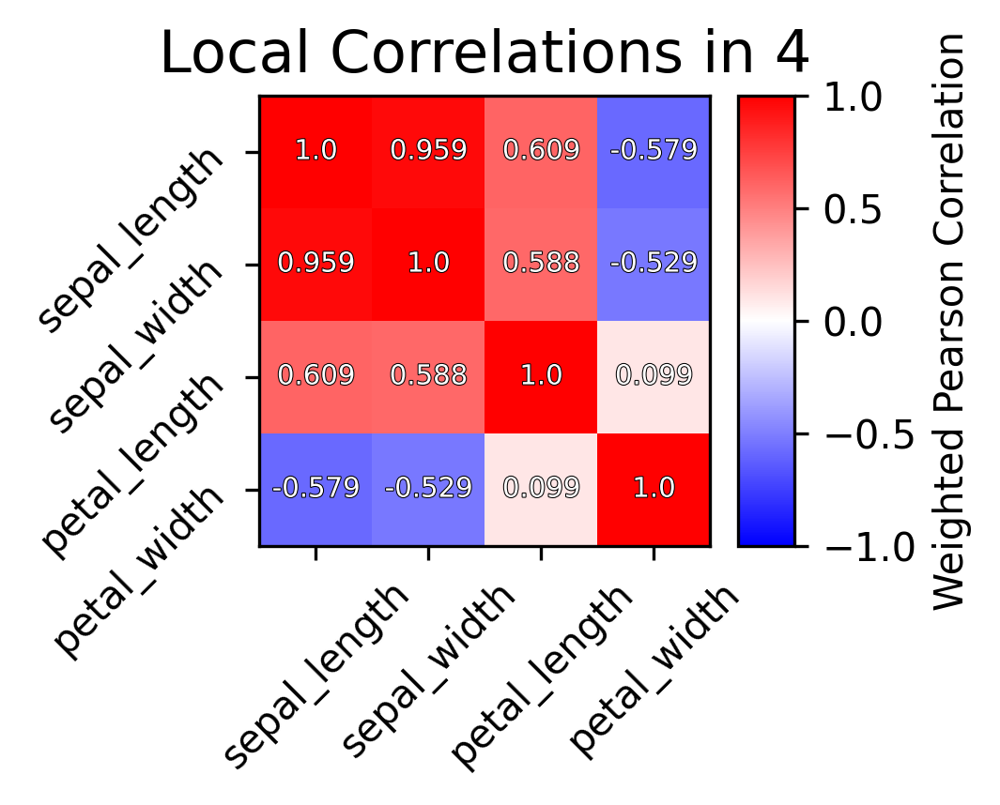

Generating top global


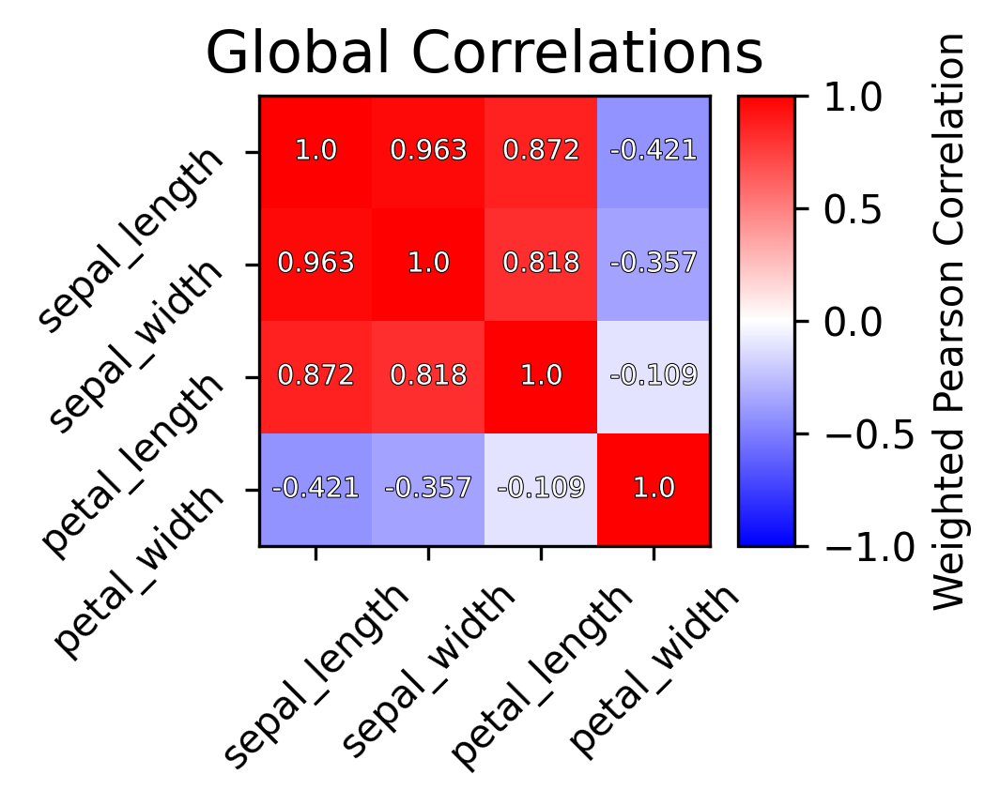

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/4/
Error: P:[11.82816479  3.50174627 43.43359011 10.35774112],A:[13.13986892  3.55498431 44.52902508 10.42261618]
Error ratio: [0.90723364 0.98831213 0.97593985 0.99432047]
Generating top local


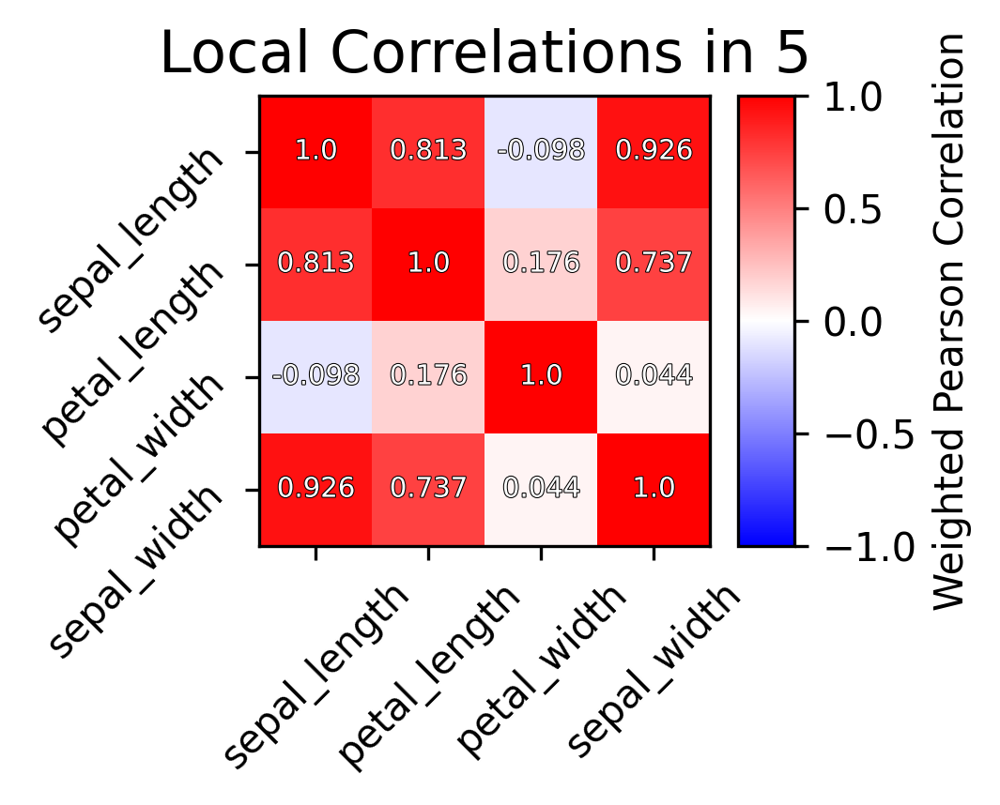

Generating top global


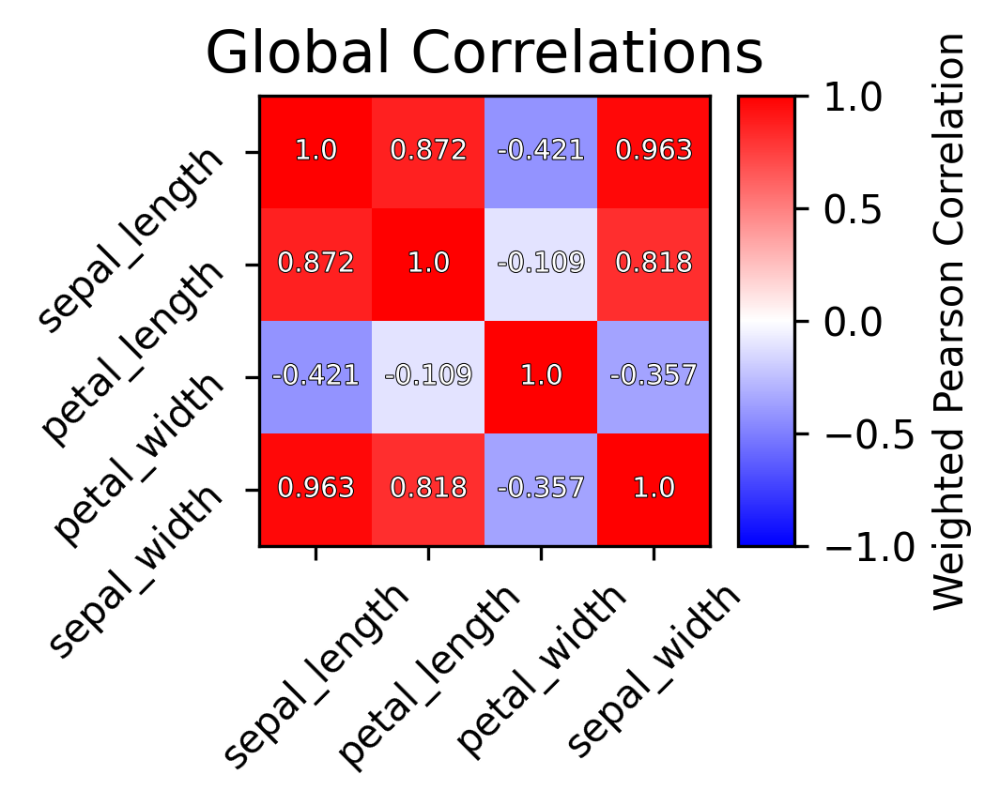

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/5/
Error: P:[ 9.74154085  2.30917333 28.02969229  5.05591072],A:[12.03738353  2.32962423 30.14377717  5.17638711]
Error ratio: [0.82390311 0.99385789 0.93211855 0.98049404]
Generating top local


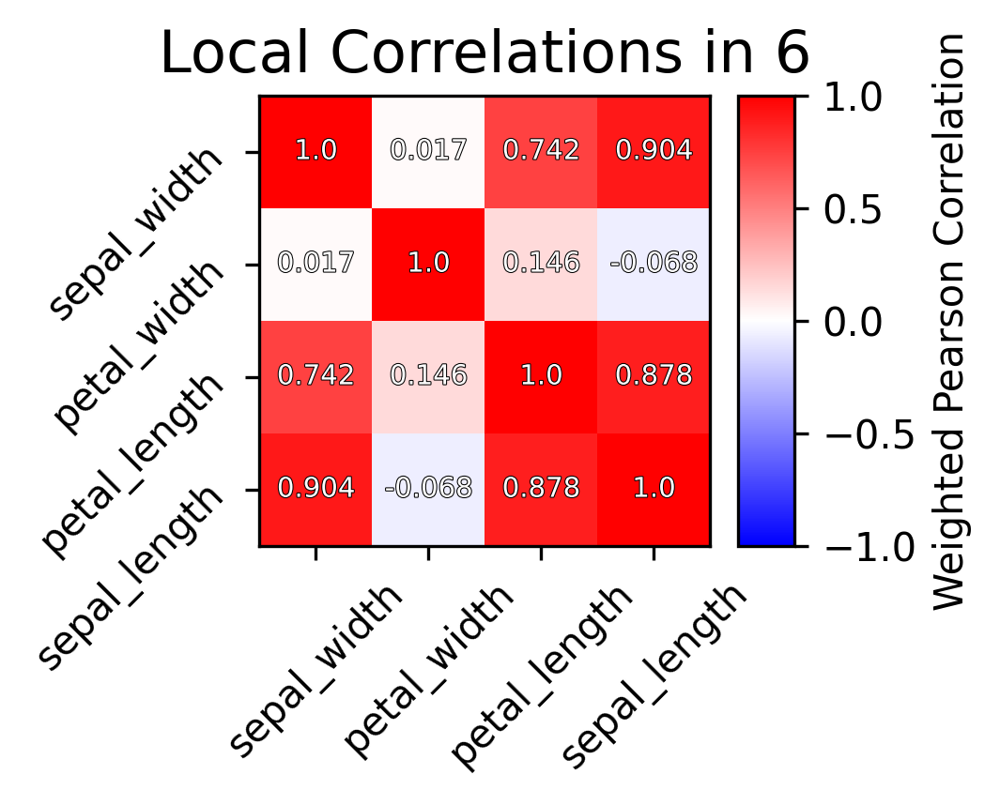

Generating top global


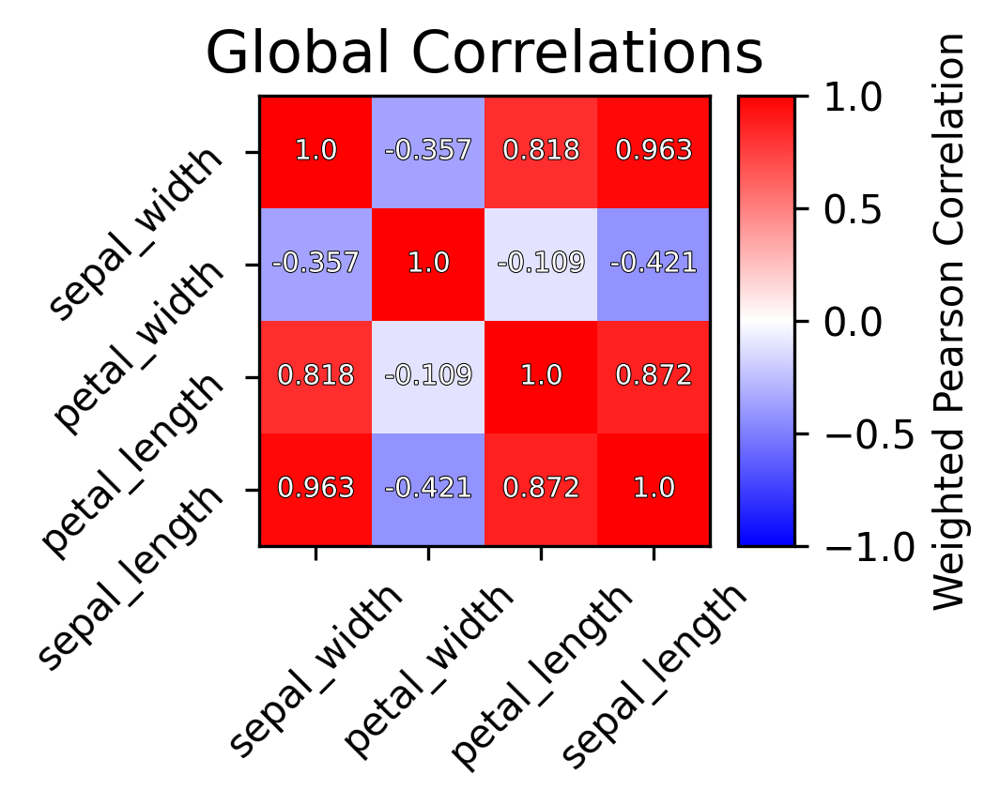

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/6/
Error: P:[10.25015054  2.55931325 26.43257719  5.93578538],A:[13.59515313  2.55466399 44.00210695  9.71783506]
Error ratio: [0.77081415 1.00130793 0.60958428 0.64712559]
Generating top local


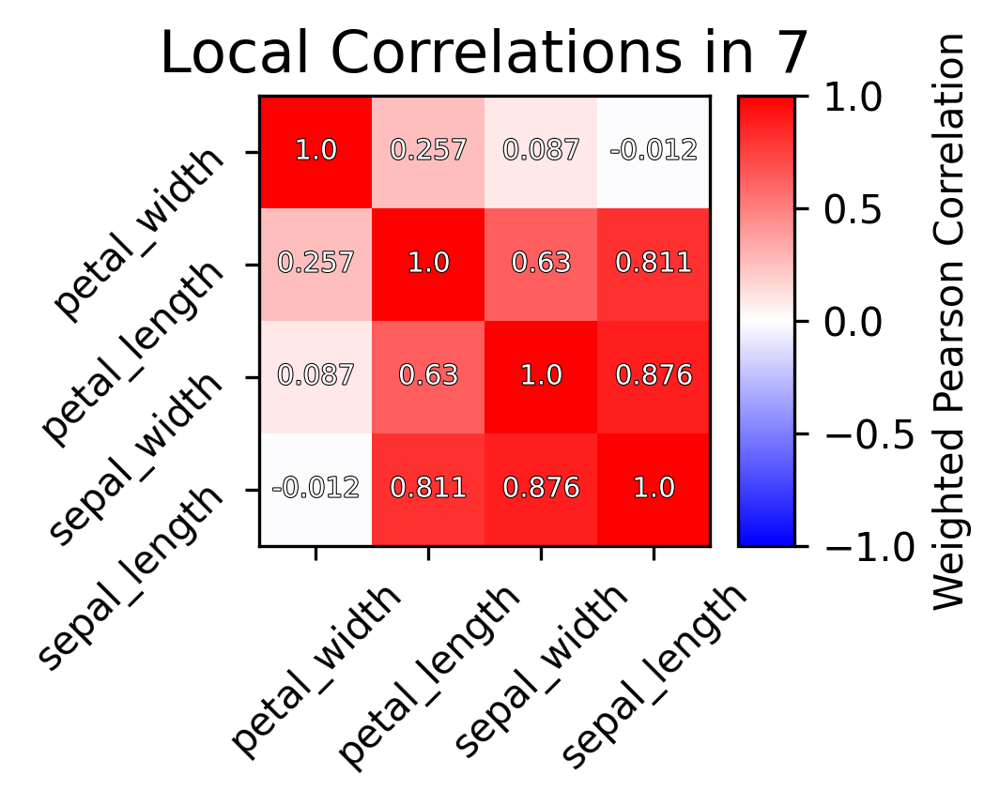

Generating top global


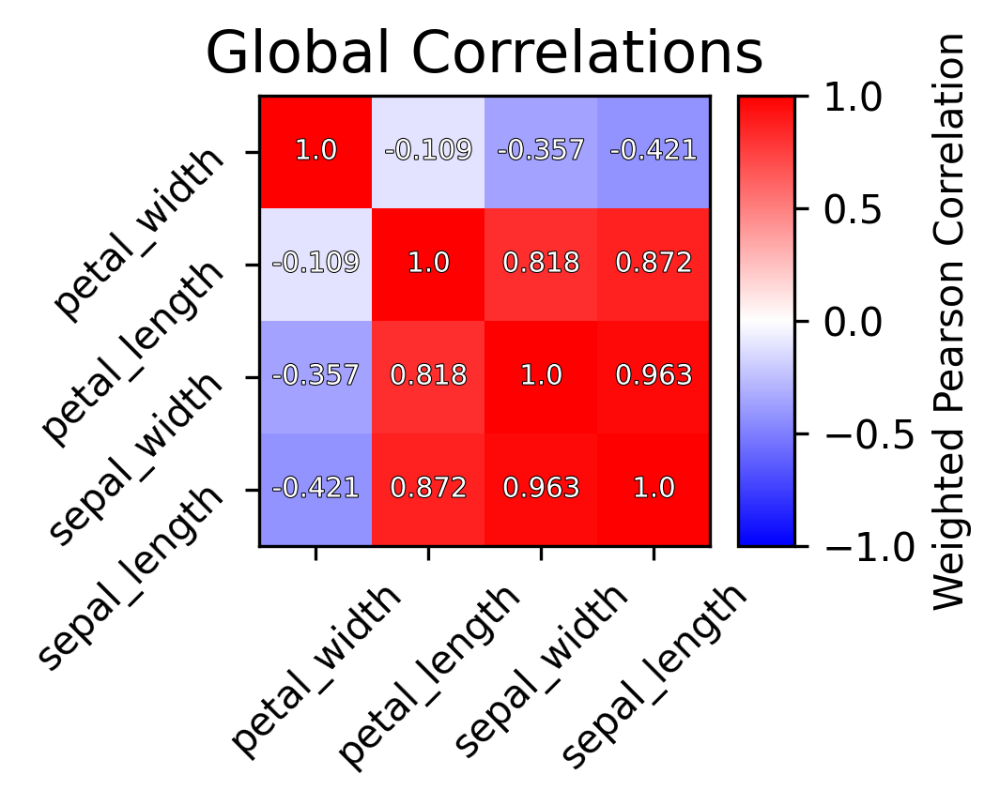

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/7/
Error: P:[4.91513817 4.95130539 7.71368183 1.50361216],A:[ 5.45989377  6.43689254 20.01680907  3.48113655]
Error ratio: [0.91567112 0.80024087 0.41460537 0.55870026]
Generating top local


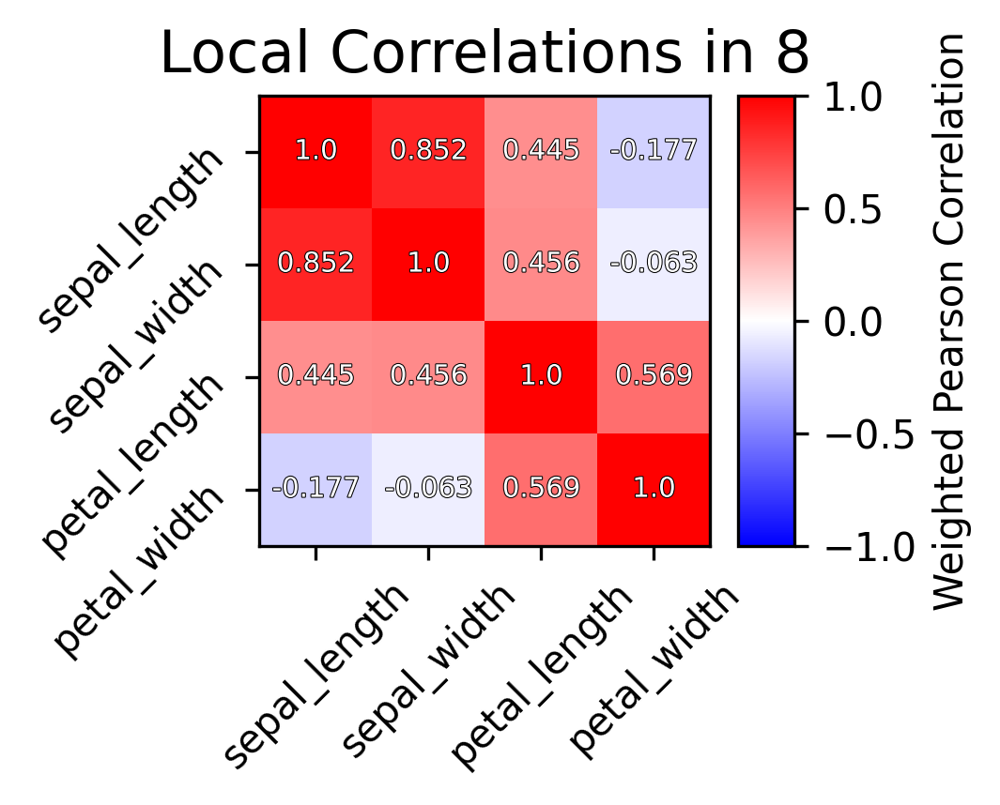

Generating top global


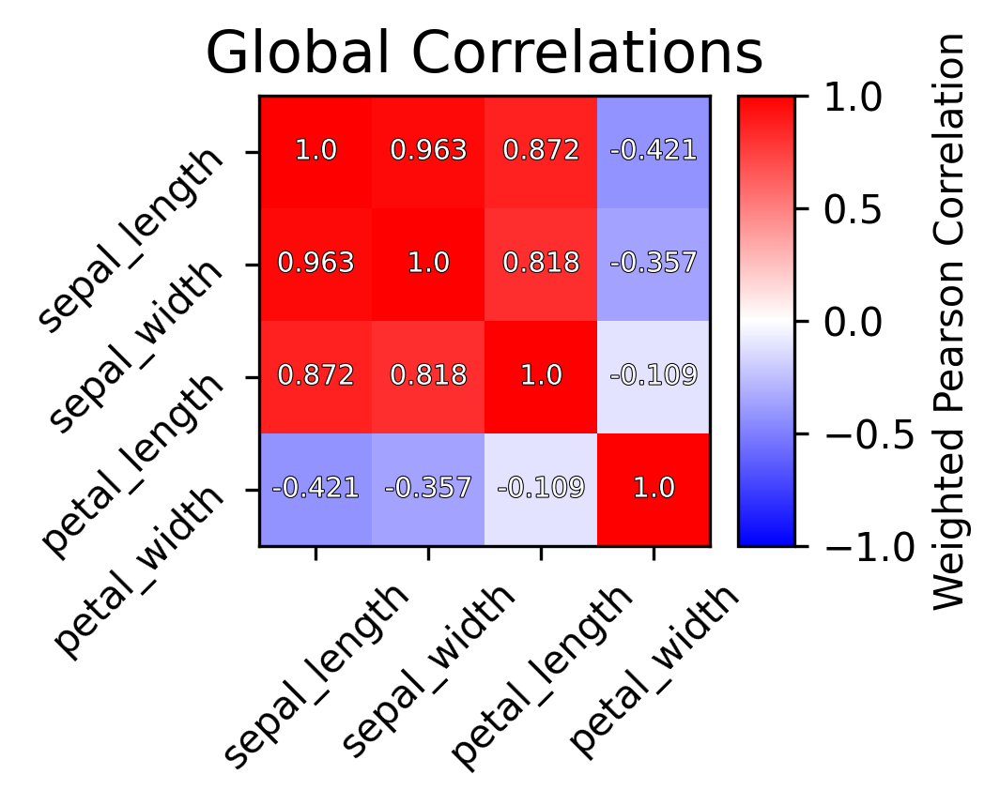

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/8/
Error: P:[18.2925665   5.03379268 66.21988867 12.04245432],A:[19.23845661  5.50298446 67.62470909 12.77967289]
Error ratio: [0.95326273 0.92784978 0.97952894 0.94649956]
Generating top local


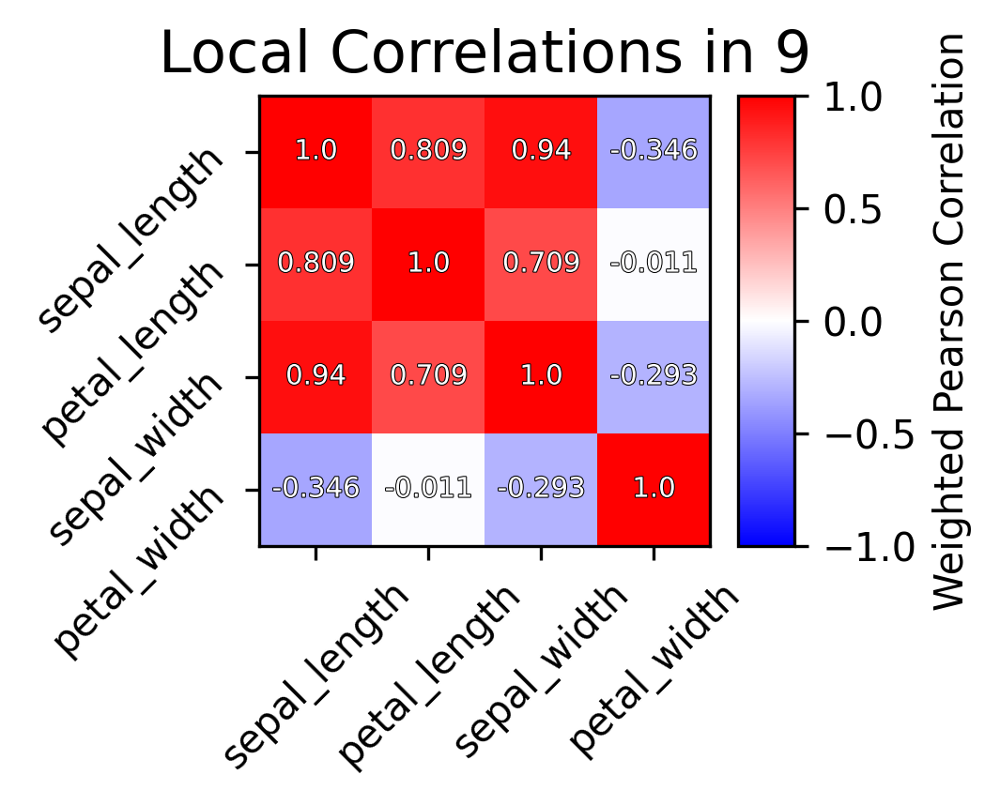

Generating top global


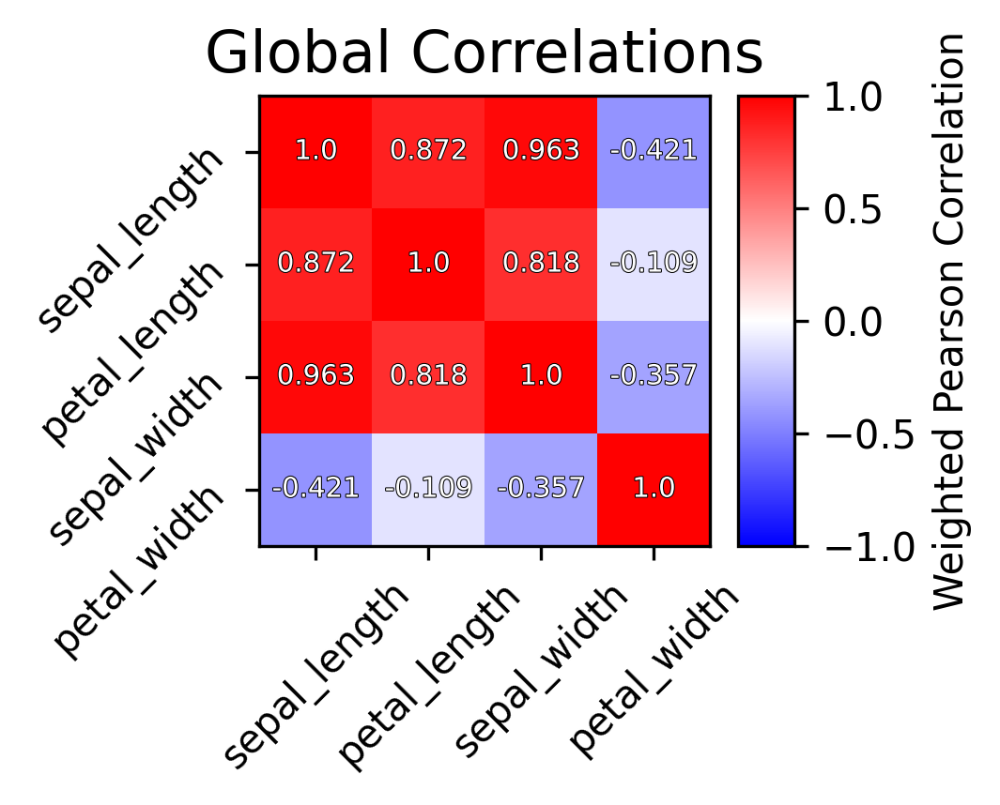

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/9/
Error: P:[11.41920343  4.62501522 51.96589599  8.36947365],A:[11.71535422  4.6197742  54.77794967  9.32751151]
Error ratio: [0.9767092  1.0009326  0.94958485 0.90723439]
Generating top local


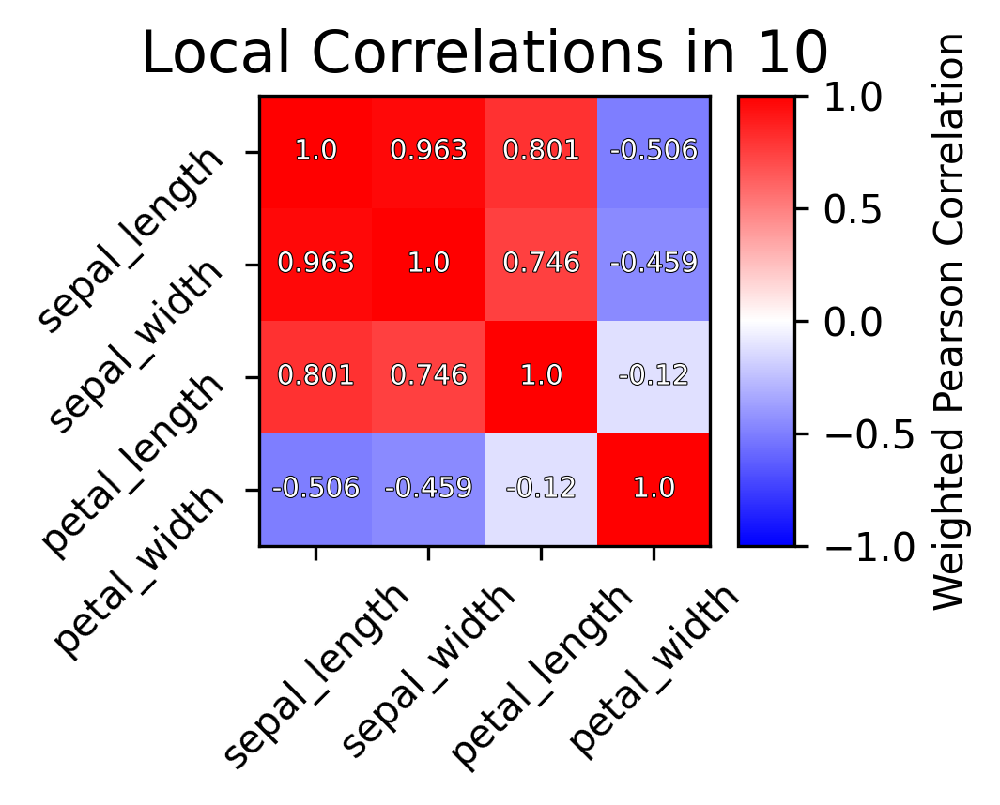

Generating top global


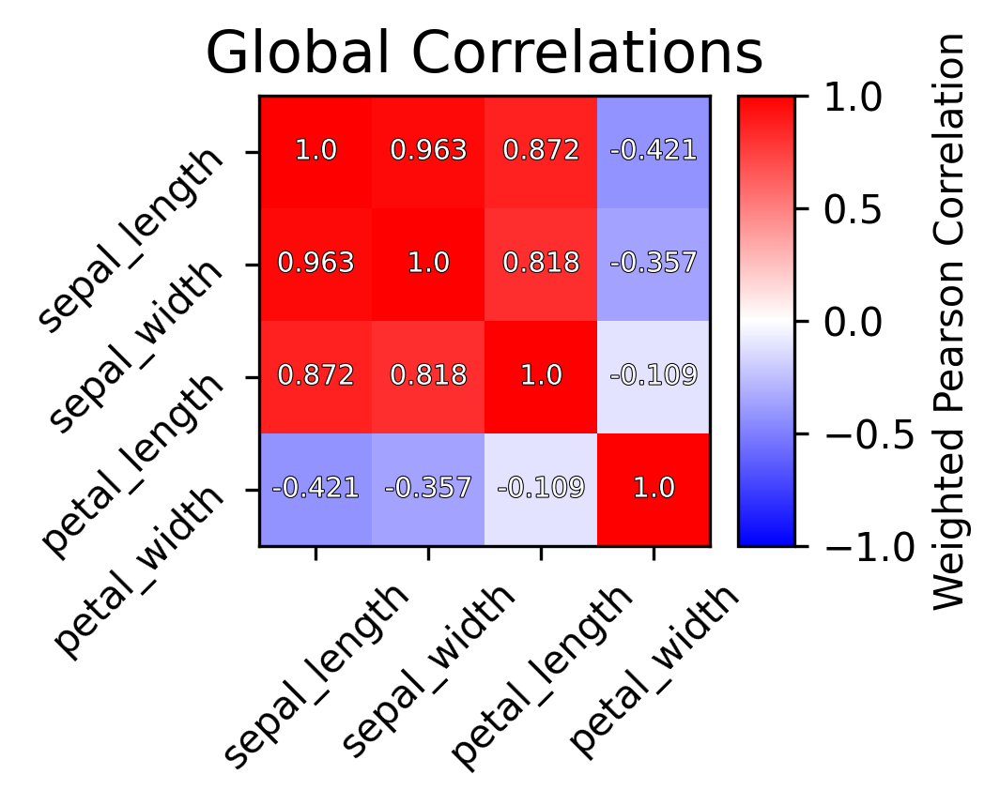

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/10/
Error: P:[ 6.32604939  1.87035029 17.74845061  3.21565568],A:[ 7.40111224  4.38508442 47.21627976  8.04386804]
Error ratio: [0.87203327 0.53301862 0.38884067 0.46613414]
Generating top local


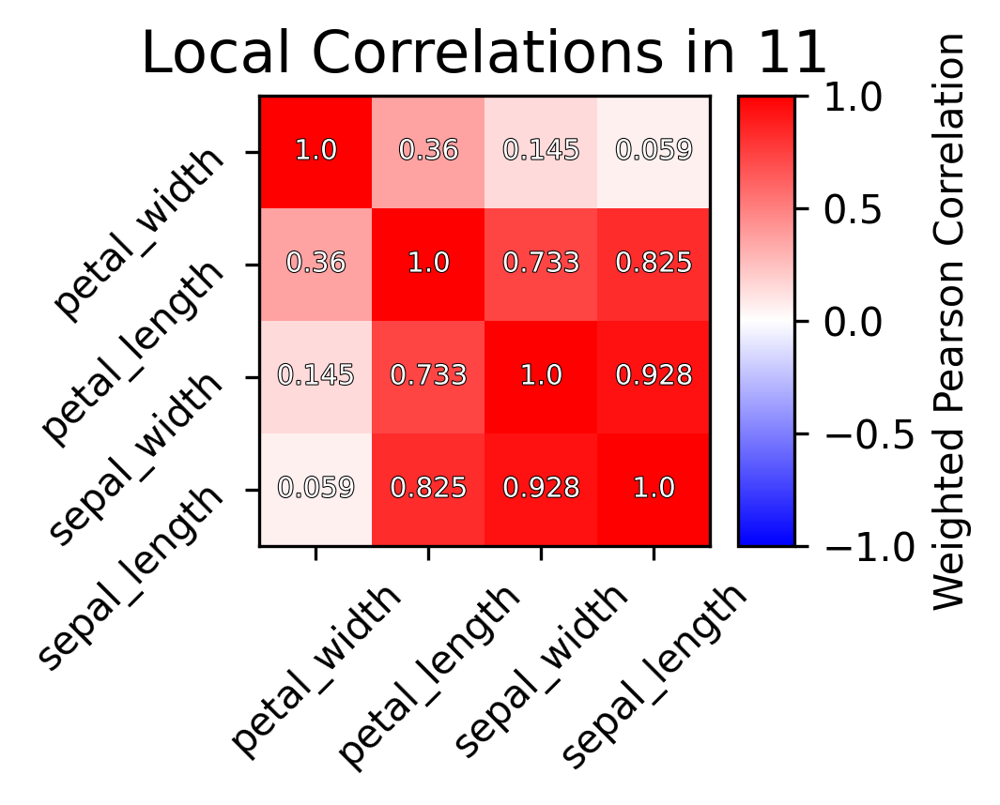

Generating top global


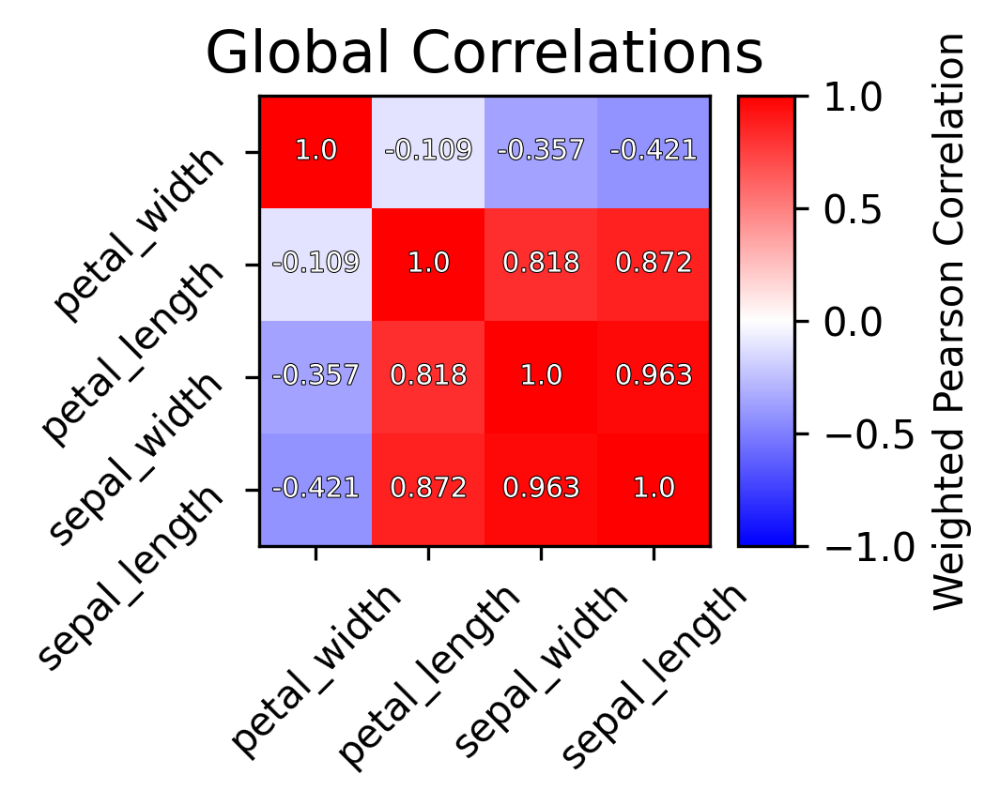

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/11/
Error: P:[12.8478014   3.26229079 37.31250142  7.30624915],A:[16.54835932  3.28426345 49.71226515 11.43365502]
Error ratio: [0.78912228 0.99487131 0.75548787 0.66804565]
Generating top local


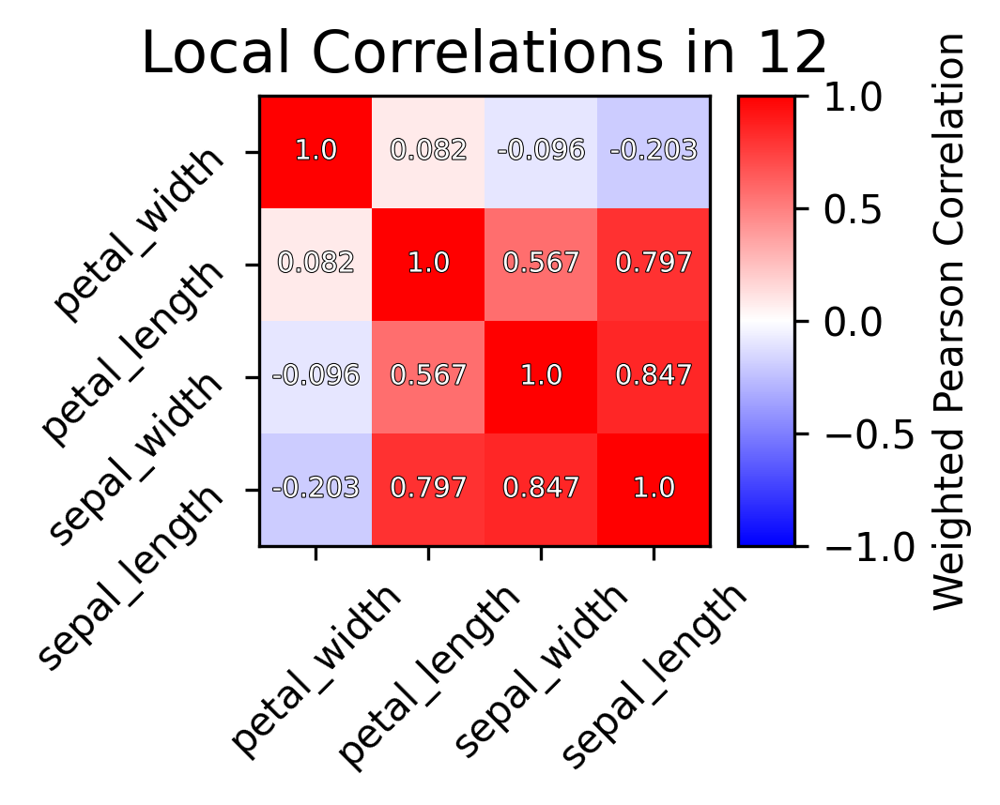

Generating top global


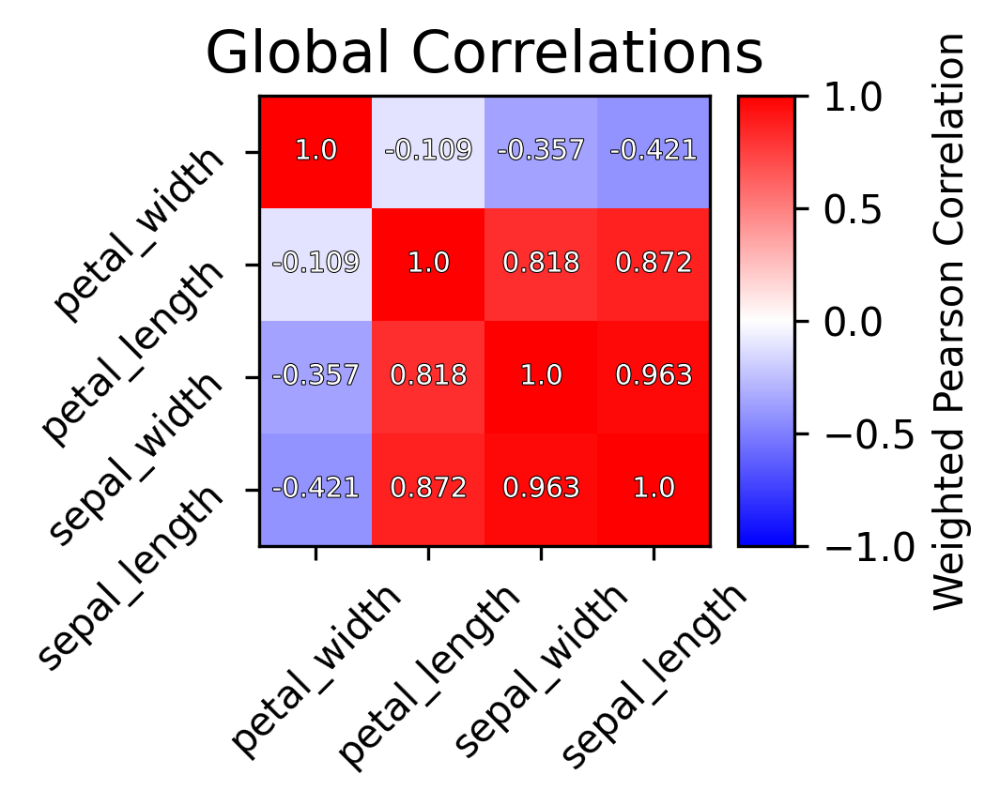

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/12/


In [7]:
forest.html_tree_summary(
    
    n=2,
    # This parameter controls how many features are used when summarizing particular nodes. 
    
    output=None
    # If you would like your HTML report to be saved to a particular location, put it here. 
    # BE WARNED, anything currently at that location WILL be deleted, so don't point this option at a populated
    # directory. 
)

What happened here?

We have clustered the nodes of the RFR into groups based on the effects they predict in their children. Each group of nodes is called a "factor" because similarly to factors used in factor analysis, they summarize the behavior of several observed variables that tend to move together in some way. Like other factors, RF factors produce certain "scores" for each sample, reflecting the likelihood that an effect predicted by the factor "applies" to a particular sample.

Factors can also give "sister scores" 

After you've looked at the consensus tree, you may want to start annotating the individual 

To do this, you can name particular 